# Part 1: Scraping the data

The first step of this project was scraping all the data that could be found within the DTU course database. This is very similar to how we scraped the data involving the philosopher pages from wikipedia in the course. We had to, however, circumvent some security mechanism (automated web browser re-direction) which lead to the use of selenium webdriver. Then the scraped data was structured so they could be exported as csv files. 

In [654]:
# THE CODE THAT DID THE MAGIC! BUT REMEMBER TO INSTALL SELENIUM AND WEBDRIVER, DO SOME BROWSING TO FIGURE IT OUT. ALSO ENDEAVOUR
# RUN THE CELL WITH ONLY ONLY LIBRARIES.:)

import urllib2
from bs4 import BeautifulSoup
from lxml import html
import xml.etree.ElementTree as ET
from selenium import webdriver
import unicodecsv as csv
from io import BytesIO




depts = {"1":u"Department of Applied Mathematics and Computer Science","10":u"Department of Physics","11": 
         u"Department of Civil Engineering", "12":u"Department of Environmental Engineering","13":u"Department of Transport",
        "23":u"National Food Institute", "24":u"National Veterinary Institute", "25": u"National Institute of Aquatic Resources",
         "26":u"Department of Chemistry","27":u"Department of Systems Biology", "28":u"Department of Chemical Engineering", "30":
        u"National Space Institute", "31":u"Department of Electrical Engineering", "33": u"Department of Micro and Nanotechnology",
        "34": u"Department of Photonics Engineering","41": u"Department of Mechanical Engineering","42":
         u"DTU Management Engineering","46": u"DTU Wind Energy", "47": u"DTU", "83": u"Other courses", "IHK":u"DTU Diplom"}

for bros in depts:
    
    columns = [u"COURSE NUMBER",
               u"COURSE NAME",
               u"LANGUAGE OF INSTRUCTION",
               u"CREDIT LOAD",
               u"YEAR",
               u"SCHEDULE",
               u"COURSE TYPE",
               u"DEPARTMENT",
               u"GENERAL COURSE OBJECTIVES",
               u"LEARNING OBJECTIVES",
               u"CONTENT",
               u"RECOMMENDED PREREQUISITES",
               u"COURSE RESPONSIBLE",
               ]
    
    
    with open(depts[bros]+u'.csv', 'w') as csvfile:
        fieldnames = columns
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
    

    baseurl = "http://kurser.dtu.dk/search?CourseCode=&SearchKeyword=&SchedulePlacement=&Department=%s&CourseType=&TeachingLanguage=" %bros
    
    
    buks = getit(baseurl)
    
    buks = BeautifulSoup(buks,"lxml")
    b = list()
    fin = []
    
    
    for row in buks('table', {'class': 'table'})[1].tbody('tr'):
        b.append(list(row('td')))
        
    b = b[1:]
    
    for pops in b:
        if len(pops)>=4:
            fin.append(pops)
        else:
            break
            
        
    for ro in range(len(fin)):
        v = []
        fil = filter(None,fin[ro][1].get_text().split("\n"))#[3]#.split("-")[1]#.split("|")
        v.append(fil[0].split("-")[0])
        v.append(fil[0].split("-")[1])
        v.append(fil[1].split("|")[0])
        v.append(fil[1].split("|")[1])
        v.append(fil[1].split("|")[2])
        v.append(' '.join(fil[2:]))
        v.append(','.join(fin[ro][2].get_text().split()))
        v.append(depts[bros])
        
        
        
        urlsec = "http://kurser.dtu.dk/course/%s" %v[0]
        twobuks = getit(urlsec)
        twobuks = BeautifulSoup(twobuks,"lxml")
        gg = None
        hh = None
        ii = None
        tempor = []
        stanlo = twobuks.find_all("div",class_="box")
        
        
        for tf in range(len(list(stanlo[1]))):
            try:
                if list(stanlo[1])[tf].text=="Learning objectives":
                    gg = tf
            except:
                pass
        for ie in list(stanlo[1])[1:gg]:
            try:
                tempor.append(ie.get_text(' '))
            except:
                tempor.append(ie)
        v.append(filter(None,''.join(tempor)))
        
        tempor = []
        gg = list(stanlo[1])[gg+2:]
        for tr in range(len(gg)):
            try:
                if gg[tr].text=="Content":
                    hh = tr
            except:
                pass
            
        for eg in gg[0:hh]:
            try:
                tempor.append(eg.get_text(' '))
            except:
                tempor.append(eg)
        v.append(filter(None,''.join(tempor)))
        
        hh = gg[hh+1:]
        for li in range(len(hh)):
            try:
                if hh[li].name == 'div':
                    ii = li
                    break
            except:
                pass
        
        tempor = []

        for cj in hh[:ii]:
            try:
                tempor.append(cj.get_text(' '))
            except:
                tempor.append(cj)
        v.append(filter(None,''.join(tempor)))
        
        gg = None
        hh = None
        tempor = []
        
        stanlo = twobuks.find_all("table")
        gg = stanlo[1].find_all("tr")
        
        for i in range(len(gg)):
            if "Recommended prerequisites" in gg[i].get_text():
                hh = ' '.join([k.text for k in list(gg[i])[1:]])
                hh = re.sub(ur'[\W_]+', u' ', hh, flags=re.UNICODE)
                hh = [ij for ij in hh.split() if  len(ij) == 5]
                hh = u','.join(set([ip for ip in hh if ip.isalpha()==False]))
                v.append(hh)
                
            else:
                tempor.append('None')
                
        if len(tempor)==len(gg):
            v.append(u'None')
        
        
        tempor = []
        gg = stanlo[2].find_all("tr")
        
        for crew in range(0,len(gg[0].find_all("a")),2):
            it = gg[0].find_all("a")[crew].text
            tempor.append(it)
            
        v.append(u','.join(tempor))
        

        with open(depts[bros]+".csv",'a') as b:
            wr = csv.writer(b,dialect='excel',encoding='utf-8')
            wr.writerow(v)

**Parsing the xml encoded content of the webpages**

In [604]:
gg = []
ebuks = BeautifulSoup(buks,"lxml")
#for row in ebuks('table', {'class': 'table'})[0].tbody('tr'):
#        gg.append(list(row('td')))
        
stanlo = ebuks.find_all("div",class_="box")
#for ij in range(len(list(stanlo[1]))):
#    try:
#        if list(stanlo[1])[ij].text=="Learning objectives":
#            print ij
#    except:
#        pass
    
#yi = []
#for tf in list(stanlo[1])[1:19]:
#    try:
#        yi.append(tf.text)
#    except:
#        yi.append(tf)
#filter(None,''.join(yi))
#print list(stanlo[1])[6]
i = []
i.append(list(stanlo[1])[6])#.get_text(' ')
print i

[u'\n- \n']


**Printing out a small sample**

In [592]:
while True:
    browser = webdriver.Chrome()
    browser.get("http://kurser.dtu.dk/course/62L14")
    buks = browser.page_source
    if len(browser.page_source)>6000:
        #buks = browser.page_source
        print buks
        browser.quit()
        break
    else:
        browser.quit()

<!DOCTYPE html><html xmlns="http://www.w3.org/1999/xhtml" class=" js flexbox flexboxlegacy canvas canvastext webgl no-touch geolocation postmessage websqldatabase indexeddb hashchange history draganddrop websockets rgba hsla multiplebgs backgroundsize borderimage borderradius boxshadow textshadow opacity cssanimations csscolumns cssgradients cssreflections csstransforms csstransforms3d csstransitions fontface generatedcontent video audio localstorage sessionstorage webworkers applicationcache svg inlinesvg smil svgclippaths"><head>
    <meta http-equiv="X-UA-Compatible" content="IE=edge" />
    <meta charset="utf-8" />
    <meta name="viewport" content="width=device-width, initial-scale=1.0" />
    <title>Course Base</title>
    <link href="/bundles_css_general?v=qVqqVIQy6avPbLKKmHYjFX6_q13zG0NuKo5df4PFThw1" rel="stylesheet" />

    <script src="/bundles_js_general?v=-0apSkCWt1Bhbe8xDX8ezCAlskhkkWCFtEY3HLUdcEk1"></script>

    


    <script>
        $(function () {
            $("[dat

**The process of tabulating the scraped content to be used as csv files**

In [593]:
ss = ebuks.find_all("table")
gg = ss[1].find_all("tr")
aq = []
for i in range(len(gg)):
    if "Recommended prerequisites" in gg[i].get_text():
        t = ' '.join([k.text for k in list(gg[i])[1:]])
        t = re.sub(ur'[\W_]+', u' ', t, flags=re.UNICODE)
        t = [ij for ij in t.split() if  len(ij) == 5]
        t = ','.join(set([ip for ip in t if ip.isalpha()==False]))
print t
#gg

In [605]:
#printing another small sample
ff = ss[2].find_all("tr")
ff[0].find_all("a")[0].text

u'\nPer Goltermann'

**starting the process of putting the content of each department into dataframes that can be exported as csv files on a small sample**

In [663]:
df = pd.read_csv('Department of Photonics Engineering.csv', header=None)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,COURSE NUMBER,COURSE NAME,LANGUAGE OF INSTRUCTION,CREDIT LOAD,YEAR,SCHEDULE,COURSE TYPE,DEPARTMENT,GENERAL COURSE OBJECTIVES,LEARNING OBJECTIVES,CONTENT,RECOMMENDED PREREQUISITES,COURSE RESPONSIBLE
1,34020,Optics and Photonics,English,5 ECTS,2016/2017,F1B (Thurs 13-17),BSc,Department of Photonics Engineering,\r\nThe course provides a broad introduction t...,"Identify whether a ray optics, a scalar wave o...","\r\nThe following concepts and phenomena, and ...","10013,31400,10036,10009",\r\nMartijn Wubs
2,34021,Introduction to Optics and Photonics,Danish,5 ECTS,2016/2017,F1B (Thurs 13-17) or E2B (Thurs 8-12),BSc,Department of Photonics Engineering,\r\nThe course provides a broad and fundamenta...,Calculate and measure the radiometric and phot...,"\r\nThe following concepts and phenomena, and ...","31400,10036,34120,10020",\r\nMichael Linde Jakobsen
3,34029,Physics Project,Danish,10 ECTS,2016/2017,Fall and January or Spring and June,BSc,Department of Photonics Engineering,\r\nTo perform a larger experimental or theore...,find and select relevant literature search out...,\r\nProject: Subjects with relation to the res...,10030,\r\nMorten Bache
4,34031,Applied Mathematics for Physicists,English,5 ECTS,2016/2017,F3A (Tues 8-12),BSc,Department of Photonics Engineering,"\r\nTo introduce concepts, tools and methods f...",determine whether an equation is linear or non...,\r\nFourier- and Laplace integral transformati...,"01005,10020,10036",\r\nOle Bang
5,34032,Optical Properties of Solids,English,5 ECTS,2016/2017,E1B (Thurs 13-17),MSc,Department of Photonics Engineering,"\r\nThis course, formerly called Modern Photon...",Derive the Kramers-Kronig relations for linear...,\r\nElectromagnetism in dielectrics and metals...,"34033,10036,10303,10102","\r\nMartijn Wubs,\r\nNicolas Stenger"
6,34034,Applied photonics,English,5 ECTS,2016/2017,E1A (Mon 8-12),MSc,Department of Photonics Engineering,\r\nThe course aims towards an introduction to...,design a resonator system with special propert...,"\r\nLaser beams, laser resonators, photonics, ...","34020,34127,34033,10370","\r\nPeter Tidemand-Lichtenberg,\r\nKresten Yvind"
7,34041,Waveguide optics,English,5 ECTS,2016/2017,F4B (Fri 8-12),MSc,Department of Photonics Engineering,\r\nTo establish a solid understanding of the ...,Describe the structure of modal fields in in o...,"\r\nStarting from Maxwell's equations, the fun...","31400,10036,34033,10370","\r\nJesper Lægsgaard,\r\nPeter Uhd Jepsen"
8,34042,Quantum Photonic Communication,English,5 ECTS,2016/2017,E3A (Tues 8-12),MSc,Department of Photonics Engineering,\r\nQuantum photonics is now ready to be trans...,Describe the concept and the advantages of qua...,\r\nThe course will be composed of:\r\n\r\n• L...,None,\r\nNika Akopian
9,34046,Experimental Methods in Photonics,English,5 ECTS,2016/2017,January,MSc,Department of Photonics Engineering,\r\nThe focus of this course is to introduce s...,Operate freely and explain differences between...,\r\nThe course contains lectures on\r\n\r\n• R...,34020,"\r\nPeter Uhd Jepsen,\r\nKrzysztof Iwaszczuk"


**The whole script for scraping the content and structuring them as dataframes that can be exported as csv files. It should be noted that this still took a long time to complete due to the DTU course site safety mechanism forcing more loops to keep scraping process from being redirected other pages**

In [ ]:
import urllib2
from bs4 import BeautifulSoup
from lxml import html
import xml.etree.ElementTree as ET
from selenium import webdriver




depts = {"1":"Department of Applied Mathematics and Computer Science","10":"Department of Physics","11": 
         "Department of Civil Engineering", "12":"Department of Environmental Engineering","13":"Department of Transport",
        "23":"National Food Institute", "24":"National Veterinary Institute", "25": "National Institute of Aquatic Resources",
         "26":"Department of Chemistry","27":"Department of Systems Biology", "28":"Department of Chemical Engineering", "30":
        "National Space Institute", "31":"Department of Electrical Engineering", "33": "Department of Micro and Nanotechnology",
        "34": "Department of Photonics Engineering","41": "Department of Mechanical Engineering","42":
         "DTU Management Engineering","46": "DTU Wind Energy", "47": "DTU", "83": "Other courses", "IHK":"DTU Diplom"}

for bros in depts:
    
    columns = ["COURSE NUMBER",
               "COURSE NAME",
               "LANGUAGE OF INSTRUCTION",
               "CREDIT LOAD",
               "YEAR",
               "SCHEDULE",
               "COURSE TYPE",
               "DEPARTMENT",
               "GENERAL COURSE OBJECTIVES",
               "LEARNING OBJECTIVES",
               "CONTENT",
               "RECOMMENDED PREREQUISITES",
               "COURSE RESPONSIBLE",
               ]
    index = np.array(np.arange(1,1001))
    df = pd.DataFrame(index=index, columns=columns)
    df = df.fillna("NaNs")
    

    baseurl = "http://kurser.dtu.dk/search?CourseCode=&SearchKeyword=&SchedulePlacement=&Department=%s&CourseType=&TeachingLanguage=" %bros
    
    
    buks = getit(baseurl)
    
    buks = BeautifulSoup(buks,"lxml")
    b = list()
    fin = []
    
    
    for row in buks('table', {'class': 'table'})[1].tbody('tr'):
        b.append(list(row('td')))
        
    b = b[1:]
    
    for pops in b:
        if len(pops)>=4:
            fin.append(pops)
        else:
            break
            
        
    for ro in range(len(fin)):
        v = []
        fil = filter(None,fin[ro][1].get_text().split("\n"))#[3]#.split("-")[1]#.split("|")
        v.append(fil[0].split("-")[0])
        v.append(fil[0].split("-")[1])
        v.append(fil[1].split("|")[0])
        v.append(fil[1].split("|")[1])
        v.append(fil[1].split("|")[2])
        v.append(' '.join(fil[2:]))
        v.append(','.join(fin[ro][2].get_text().split()))
        v.append(depts[bros])
        
        
        
        urlsec = "http://kurser.dtu.dk/course/%s" %v[0]
        twobuks = getit(urlsec)
        twobuks = BeautifulSoup(twobuks,"lxml")
        gg = None
        hh = None
        ii = None
        tempor = []
        stanlo = twobuks.find_all("div",class_="box")
        
        
        for tf in range(len(list(stanlo[1]))):
            try:
                if list(stanlo[1])[tf].text=="Learning objectives":
                    gg = tf
            except:
                pass
        for ie in list(stanlo[1])[1:gg]:
            try:
                tempor.append(ie.get_text(' '))
            except:
                tempor.append(ie)
        v.append(filter(None,''.join(tempor)))
        
        tempor = []
        gg = list(stanlo[1])[gg+2:]
        for tr in range(len(gg)):
            try:
                if gg[tr].text=="Content":
                    hh = tr
            except:
                pass
            
        for eg in gg[0:hh]:
            try:
                tempor.append(eg.get_text(' '))
            except:
                tempor.append(eg)
        v.append(filter(None,''.join(tempor)))
        
        hh = gg[hh+1:]
        for li in range(len(hh)):
            try:
                if hh[li].name == 'div':
                    ii = li
                    break
            except:
                pass
        
        tempor = []

        for cj in hh[:ii]:
            try:
                tempor.append(cj.get_text(' '))
            except:
                tempor.append(cj)
        v.append(filter(None,''.join(tempor)))
        
        gg = None
        hh = None
        tempor = []
        
        stanlo = twobuks.find_all("table")
        gg = stanlo[1].find_all("tr")
        
        for i in range(len(gg)):
            if "Recommended prerequisites" in gg[i].get_text():
                hh = ' '.join([k.text for k in list(gg[i])[1:]])
                hh = re.sub(ur'[\W_]+', u' ', hh, flags=re.UNICODE)
                hh = [ij for ij in hh.split() if  len(ij) == 5]
                hh = ','.join(set([ip for ip in hh if ip.isalpha()==False]))
                
        v.append(hh)
        
        gg = stanlo[2].find_all("tr")
        
        for crew in range(0,len(gg[0].find_all("a")),2):
            it = gg[0].find_all("a")[crew].text
            tempor.append(it)
            
        v.append(','.join(tempor))
        
        
        #print v
        df.loc[ro+1] = np.array(v)
    #print df
    df = df.drop([i for i in range(len(fin)+1,1001)])
    df.to_csv(depts[bros]+u'.csv', sep="\t", encoding="utf-8")


# Part 2: Creating the whole network

The first approach to analyzing the data was to create a DTU course network where the link/connection between the courses where the recommended prerequisites that could be found on their content site

In [8]:
import re
import networkx as nx
import matplotlib.pyplot as plt
import os
import pandas as pd
import operator
import community
from __future__ import division
import itertools
from collections import defaultdict
from itertools import izip_longest
import operator
import numpy as np
from collections import Counter
from networkx.algorithms import bipartite
%matplotlib inline

In [2]:
#first part was retrieving the data which is ouputted as csv files containg
#course information for each course within each department
#next part is about creating a network of all the courses
#firstly the csv files containing the data are loaded into python
#overview of csv files content:
#checkout assignment 2 for some network analysis 

#COURSE NUMBER,COURSE NAME,LANGUAGE OF INSTRUCTION,CREDIT LOAD,YEAR,SCHEDULE,COURSE TYPE,DEPARTMENT,GENERAL COURSE OBJECTIVES,LEARNING OBJECTIVES,CONTENT,RECOMMENDED PREREQUISITES,COURSE RESPONSIBLE

rootdir='C:/Users/DRC/Desktop/social_csv_folder'
list_of_df_for_each_department={}
for filename in os.listdir(rootdir):
    if filename.endswith('.csv'):
        #print filename
        df=pd.read_csv(rootdir+'/'+filename,converters={'COURSE NUMBER': lambda x: str(x),'RECOMMENDED PREREQUISITES':lambda x: str(x)})
        list_of_df_for_each_department[filename]=df

In [3]:
#printing out the lenght of the list which should coorelate to 21 departments
len(list_of_df_for_each_department)

21

In [4]:
#printing a sample dataframe
list_of_df_for_each_department.values()[0]

,COURSE NUMBER,COURSE NAME,LANGUAGE OF INSTRUCTION,CREDIT LOAD,YEAR,SCHEDULE,COURSE TYPE,DEPARTMENT,GENERAL COURSE OBJECTIVES,LEARNING OBJECTIVES,CONTENT,RECOMMENDED PREREQUISITES,COURSE RESPONSIBLE
0,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
1,27002,Life Science,Danish,5 ECTS,2016/2017,E1B (Thurs 13-17),BSc,Department of Systems Biology,\nThe students should based on the cell acquir...,"Describe the spatial, logistic, and structural...",\nThe cell as basic biological unit: structure...,None,"\nMogens Kilstrup,\nJan Martinussen"
2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
3,27004,"Health, Diseases and Technology",Danish,10 ECTS,2016/2017,E4B (Fri 8-12) and January,BSc,Department of Systems Biology,\nThe course introduces the students to the ba...,Describe in general terms the processes in dev...,\nThe course runs through the 13- and 3-week p...,None,"\nJose Maria Gonzalez-Izarzugaza,\nLasse Folke..."
4,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
5,27007,Biotechnology and communication,Danish,10 ECTS,2016/2017,E4B (Fri 8-12) and January,BSc,Department of Systems Biology,\nThe course provides the student with insight...,Describe examples of the work areas of biotech...,\nThe course runs through the 13- and 3-week p...,None,"\nRasmus John Normand Frandsen,\nMalene Bonné ..."
6,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
7,27008,Life Science,English,5 ECTS,2016/2017,F5B (Wed 13-17),BSc,Department of Systems Biology,\nThe students should based on the cell acquir...,"Describe the spatial, logistic, and structural...",\nThe cell as basic biological unit: Structure...,None,"\nJan Martinussen,\nMogens Kilstrup"
8,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN
9,27015,Introductory Project in Biotechology / Human ...,Danish,10 ECTS,2016/2017,E5A (Wed 8-12) and January,BSc,Department of Systems Biology,\nBy performing a review project within biotec...,"Perform a comprehensive literature search, to ...",\nThe topic for the project is chosen from a c...,27002,"\nClaus Sternberg,\nOle Lund"


In [13]:
# we merge all the dataframes to complete a complete network across all departmetns
merged_df=pd.concat(list_of_df_for_each_department.values(),join='inner')

In [14]:
#we clean the dataframe for nan values
cleaned_merged=merged_df.dropna(thresh=len(merged_df.columns.values))

In [28]:
cleaned_merged.head().transpose()

,1,3,5,7,9
COURSE NUMBER,27002,27004,27007,27008,27015
COURSE NAME,Life Science,"Health, Diseases and Technology",Biotechnology and communication,Life Science,Introductory Project in Biotechology / Human ...
LANGUAGE OF INSTRUCTION,Danish,Danish,Danish,English,Danish
CREDIT LOAD,5 ECTS,10 ECTS,10 ECTS,5 ECTS,10 ECTS
YEAR,2016/2017,2016/2017,2016/2017,2016/2017,2016/2017
SCHEDULE,E1B (Thurs 13-17),E4B (Fri 8-12) and January,E4B (Fri 8-12) and January,F5B (Wed 13-17),E5A (Wed 8-12) and January
COURSE TYPE,BSc,BSc,BSc,BSc,BSc
DEPARTMENT,Department of Systems Biology,Department of Systems Biology,Department of Systems Biology,Department of Systems Biology,Department of Systems Biology
GENERAL COURSE OBJECTIVES,\nThe students should based on the cell acquir...,\nThe course introduces the students to the ba...,\nThe course provides the student with insight...,\nThe students should based on the cell acquir...,\nBy performing a review project within biotec...
LEARNING OBJECTIVES,"Describe the spatial, logistic, and structural...",Describe in general terms the processes in dev...,Describe examples of the work areas of biotech...,"Describe the spatial, logistic, and structural...","Perform a comprehensive literature search, to ..."


In [7]:
#retrieving the list of nodes i.e. the courses (represented by course number) from the dataframe and listing them
list_of_nodes=cleaned_merged['COURSE NUMBER'].tolist()

In [32]:
#we create a dict with course names and correponding course number
#since it could come in handy later
list_of_nodes_names=cleaned_merged['COURSE NAME'].tolist()

In [33]:
course_dict={}
for i in range(0,len(list_of_nodes_names)):
    course_dict[list_of_nodes[i]]=list_of_nodes_names[i]

# Type 1: Course network by prerequisites

We created the whole network using the recommended prerequisites found on each course page. The recommended prerequisites are direct links to other courses.

In [29]:
# now we list the links by using the prerequisites of each course
list_of_prerequistites=cleaned_merged['RECOMMENDED PREREQUISITES'].tolist()
#cleaned__list=filter(lambda v: v==v, list_of_nodes)


In [30]:
#use list_of_nodes
#we create a dict that contain the nodes and its prerequisites i.e. the edge list
links_dict={}
for i in range(0,len(list_of_nodes)):
    links_dict[list_of_nodes[i]]=list_of_prerequistites[i]

In [31]:
#the prerequistites (represented by course number) are in a string format, so it is neccessary to utilize a reqular expression to extract the course numbers in each "string" of course numbers (courses that are prerequisites) and list them in a pythong list numerical objcet
#this extraction code ignores and passes prerequisites that are nan or none values i.e. non-existent prerequisites (no outgoing links). 
new_dict_list_of_links={}
for k,v in links_dict.items():
    try:
        temp_list=re.findall('\w+',v)
        new_dict_list_of_links[k]=temp_list
    except TypeError:
        pass

In [32]:
G2=nx.DiGraph(new_dict_list_of_links)

In [33]:
list_of_links=G2.edges()

In [34]:
G2.remove_node('None')

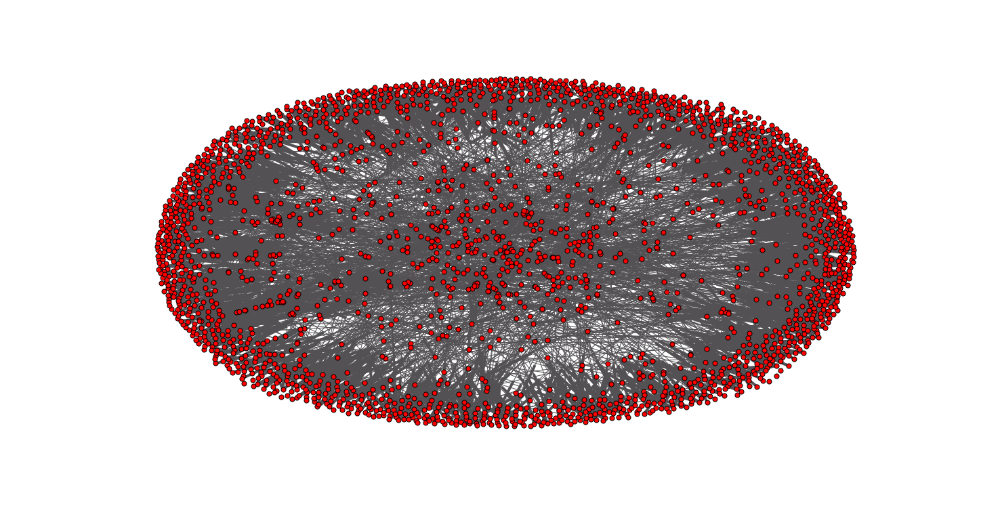

In [37]:
pos = pos=nx.spring_layout(G2, scale=5)
plt.figure(num=None, figsize=(20, 10), dpi=1500)
nx.draw(G2,pos, edge_color='#535154',node_size=50)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/course_networ_req.png')
plt.show()

**We review which course is most central in this network by betweenness central analysis. The most central course can be considered a pretty significant course by this value**

In [38]:
betweenness_cen_course=nx.betweenness_centrality(G2)

In [120]:
sorted_x = sorted(betweenness_cen_course.items(), key=operator.itemgetter(1),reverse=False)
sorted_x[-10:]

[('02131', 9.635616786915753e-06),
 ('41511', 9.692464083593721e-06),
 ('41560', 1.210847419240741e-05),
 ('02402', 1.2148267300081986e-05),
 ('41704', 1.7054189003390714e-05),
 ('41401', 1.790689845356025e-05),
 ('41502', 2.4629091285730088e-05),
 ('41612', 2.489911594495044e-05),
 ('01035', 3.510320569864589e-05),
 ('41501', 6.733562291505434e-05)]

**Then we calculate the in-degree and out-degrees to see if there are any correlation between which courses have the most in-degrees and out-degrees**

In [40]:
#we use networkx to calculate varous centrality values 
deg_cen=nx.degree_centrality(G2)
in_deg_cen=nx.in_degree_centrality(G2)
out_deg_cen=nx.out_degree_centrality(G2)

**The first thing we do is printing the top 5 courses by in-degree and out-degree**

In [41]:
sorted_in_deg = sorted(in_deg_cen.items(), key=operator.itemgetter(1),reverse=True)
for i in range(5):
    print "The Course named: %s. \t Betweenness centrality value is: %s." %(sorted_in_deg[i][0],sorted_in_deg[i][1])



The Course named: 01005. 	 Betweenness centrality value is: 0.0255986787779.
The Course named: 02631. 	 Betweenness centrality value is: 0.0177539223782.
The Course named: 02402. 	 Betweenness centrality value is: 0.0148637489678.
The Course named: 02633. 	 Betweenness centrality value is: 0.014450867052.
The Course named: 01035. 	 Betweenness centrality value is: 0.0127993393889.


In [42]:
sorted_out_deg = sorted(out_deg_cen.items(), key=operator.itemgetter(1),reverse=True)
for i in range(5):
    print "The Course named: %s. \t Betweenness centrality value is: %s." %(sorted_out_deg[i][0],sorted_out_deg[i][1])


The Course named: 62233 . 	 Betweenness centrality value is: 0.00908340214699.
The Course named: 11080 . 	 Betweenness centrality value is: 0.00619322873658.
The Course named: 02526. 	 Betweenness centrality value is: 0.00578034682081.
The Course named: 41663. 	 Betweenness centrality value is: 0.00536746490504.
The Course named: 41612. 	 Betweenness centrality value is: 0.00536746490504.


In [43]:
#Getting eigenvalue centrality for each node(philosopher) in-degree and out-degree using the networkx package
in_eigen_centrality = nx.eigenvector_centrality(G2)
out_eigen_centrality = G2.reverse()
out_eigen_centrality = nx.eigenvector_centrality(out_eigen_centrality)
sorted_in_eigen_centrality= sorted(in_eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)
sorted_out_eigen_centrality= sorted(out_eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)

In [78]:
print sorted_in_eigen_centrality[0:5]
print "__________"
print sorted_out_eigen_centrality[0:5]

[('02315', 0.7739527848302019), ('02313', 0.5394864255216049), ('02312', 0.23447173790260545), ('02314', 0.2344663593085971), ('01005', 6.454312810008982e-05)]
__________
[('02368', 0.410986298529147), ('02313', 0.3733500787045741), ('62583 ', 0.35695754984267003), ('62584 ', 0.35695754984267003), ('02315', 0.28653627229428896)]


In [86]:
#listing top 10 outliers
for outd, ind in zip(out_eigen_centrality.items(),
                     in_eigen_centrality.items()):
    if outd[1] > 0.15 and ind[1] < 0.002:
        print "Course number: ",outd[0], 'has ingoing degree', ind[1],'and outdoing degree', outd[1]

Course number:  62583  has ingoing degree 0.0 and outdoing degree 0.356957549843
Course number:  02368 has ingoing degree 0.0 and outdoing degree 0.410986298529
Course number:  62584  has ingoing degree 0.0 and outdoing degree 0.356957549843


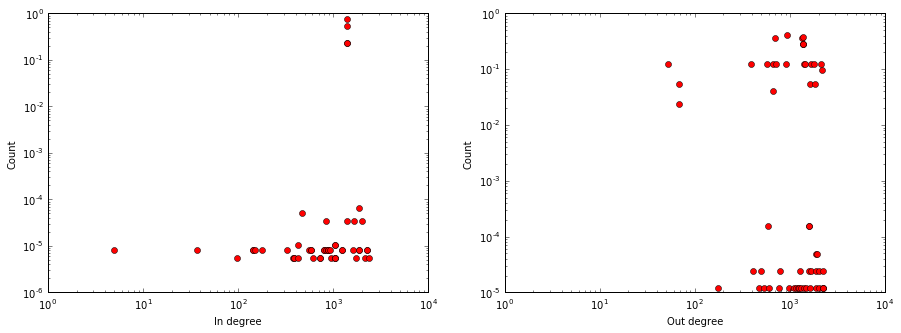

In [99]:
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
plt.subplot(1,2,1)
plt.yscale('log')
plt.xscale('log')
plt.plot(in_eigen_centrality.values(),'ro')
plt.xlabel("In degree")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.plot(out_eigen_centrality.values(),'ro')
plt.yscale('log')
plt.xscale('log')
plt.xlabel("Out degree")
plt.ylabel("Count")
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/plots_of_degrees_eigen.png')
plt.show()

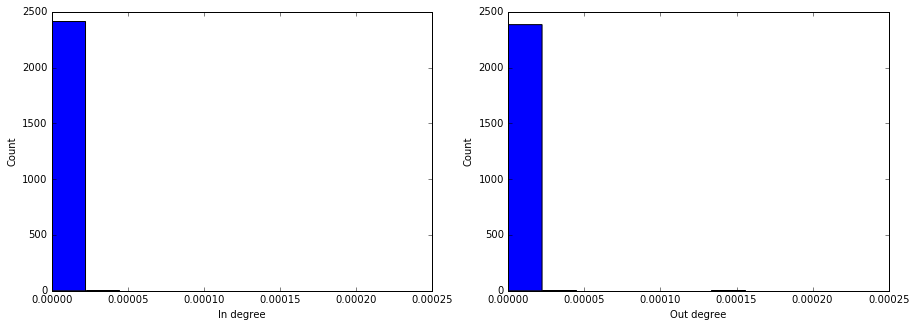

In [87]:
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
plt.subplot(1,2,1)
plt.hist(in_eigen_centrality.values(), bins=np.linspace(0,0.00020,10))
plt.xlabel("In degree")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(out_eigen_centrality.values(), bins=np.linspace(0,0.00020,10))
plt.xlabel("Out degree")
plt.ylabel("Count")
plt.savefig('C:/Users\DRC/Desktop/project for social graphs study/webpage for social graph study/bar_plots_of_degrees_eigen.png')
plt.show()

** We then plot the in-degrees and out_degrees in plots to see if there are any significant outliers**

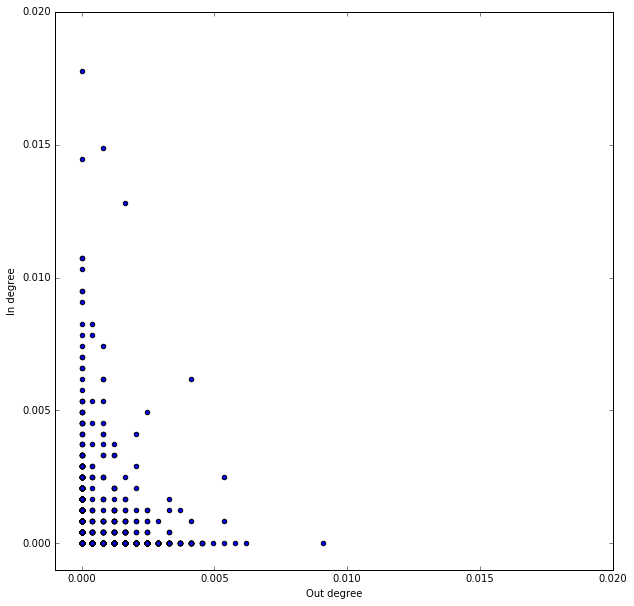

In [57]:
#Firstly a scatter plot of the in-degrees vs. out-degrees are plotted
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.scatter(out_deg_cen.values(), 
            in_deg_cen.values())
plt.xlabel('Out degree')
plt.ylabel('In degree')

#plt.axis([-2,55,-2,140])
#plt.axis([0,15,0,20])
plt.xlim(-0.001, 0.020)
plt.ylim(-0.001,0.020)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/scatter_plot_cen.png')
plt.show()

In [63]:
#listing top 10 outliers
for outd, ind in zip(out_deg_cen.items(),
                     in_deg_cen.items()):
    if outd[1] > 0.0050 and ind[1] < 0.002:
        print "Course number: ",outd[0], 'has ingoing degree', ind[1],'and outdoing degree', outd[1]

Course number:  11080  has ingoing degree 0.0 and outdoing degree 0.00619322873658
Course number:  62233  has ingoing degree 0.0 and outdoing degree 0.00908340214699
Course number:  02526 has ingoing degree 0.0 and outdoing degree 0.00578034682081
Course number:  41663 has ingoing degree 0.0 and outdoing degree 0.00536746490504
Course number:  02343 has ingoing degree 0.000825763831544 and outdoing degree 0.00536746490504


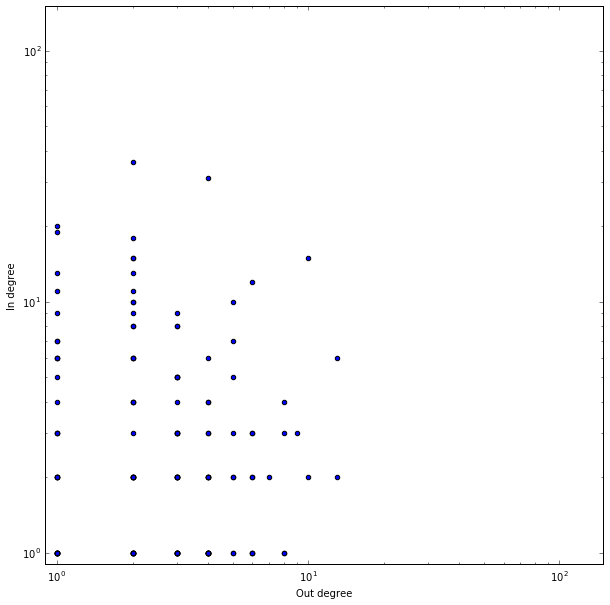

In [44]:
#Firstly a scatter plot of the in-degrees vs. out-degrees are plotted
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.scatter(G2.out_degree().values(), 
            G2.in_degree().values())
plt.xlabel('Out degree')
plt.ylabel('In degree')
plt.xscale('log')
plt.yscale('log')
#plt.axis([-2,55,-2,140])
#plt.axis([0,15,0,20])
plt.xlim(0.0, 10.)
#plt.ylim(0.,10.)
plt.xlim(9e-1, 1.5e2)
plt.ylim(9e-1, 1.5e2)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/scatter_plot.png')
plt.show()

For looking at the differences. We look at the largest disparities between degrees i.e. outliers in this case we are looking at the ones with comparetivel a significally larger value of out-degrees compared to in-degrees.

In [45]:
#listing top 10 outliers
for outd, ind in zip(G2.out_degree().items(),
                     G2.in_degree().items()):
    if outd[1] > 10 and ind[1] < 2:
        print "Course number: ",outd[0], 'has ingoing degree', ind[1],'and outdoing degree', outd[1]

Course number:  11080  has ingoing degree 0 and outdoing degree 15
Course number:  42086  has ingoing degree 0 and outdoing degree 11
Course number:  62193  has ingoing degree 0 and outdoing degree 11
Course number:  62233  has ingoing degree 0 and outdoing degree 22
Course number:  02526 has ingoing degree 0 and outdoing degree 14
Course number:  30740  has ingoing degree 0 and outdoing degree 11
Course number:  41663 has ingoing degree 0 and outdoing degree 13
Course number:  30742  has ingoing degree 0 and outdoing degree 11
Course number:  11375  has ingoing degree 0 and outdoing degree 12


We then plot the the degree values as bar plots

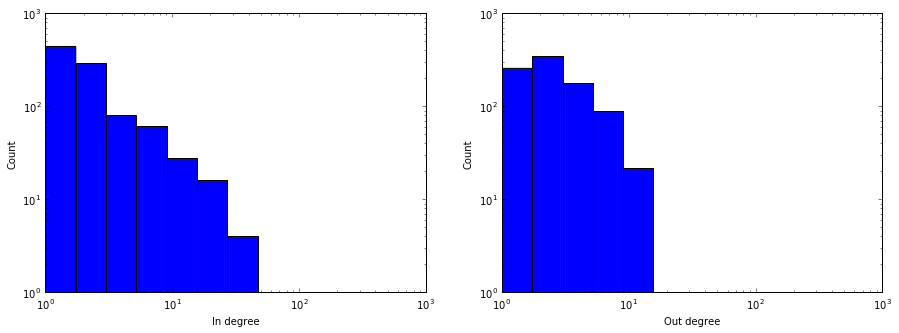

In [47]:
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
plt.subplot(1,2,1)
plt.hist(G2.in_degree().values(), bins=np.logspace(0,2.15,10))
plt.xlabel("In degree")
plt.ylabel("Count")
plt.xscale('log')
plt.yscale('log')

plt.subplot(1,2,2)
plt.hist(G2.out_degree().values(), bins=np.logspace(0,2.15,10))
plt.xlabel("Out degree")
plt.ylabel("Count")
plt.xscale('log')
plt.yscale('log')
plt.savefig('C:/Users\DRC/Desktop/project for social graphs study/webpage for social graph study/bar_plots_of_degrees.png')
plt.show()

In this course network based on prerequisites it could be interesting to test out a hypothesis that states that the number of nodes (courses) that have the shortest path being one or less, is more frequent that higher number paths, meaning that the number of courses that require no prerquisites or just 1 are morer than the ones that require several prereuisites (i.e. the prerequisite of a course might have prerequisites itself and so on). 

In [102]:
#getting degree sequence
G_degree_sequence = [d for n,d in G2.degree().iteritems()]


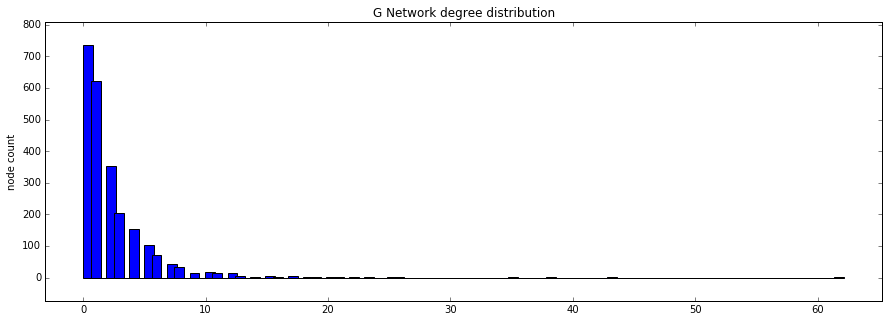

In [110]:

#computing histogram
G_val, G_bins = np.histogram(G_degree_sequence,bins=100)
G_bins = np.delete(G_bins, -1)
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
# Two subplots, the axes array is 1-d
plt.margins(0.05, 0.1) #inner margin 
plt.bar(G_bins, G_val,width=0.80, color='b')
plt.ylabel('node count')
plt.title('G Network degree distribution')
plt.setp(x1.get_xticklabels(), visible=False)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/Degree-distrubution.png')
plt.show()

It can be seen in the plot that a majority of the nodes have degree 1 and the number of them is decreasing with higher degree. This can be interpreted  as a graph/netowkr with a lot of single nodes connected to one big cluster. We can also see that there is not a single node with a degree 0 which means that if we pick every single node there is always a path to all nodes in the network from that node.

In [122]:
#we use networkx shortest path function
lenght_list=[]
for key,value in nx.shortest_path_length(G2).items():
    for k2,v2 in value.items():
        lenght_list.append(v2)

In [123]:
C1=Counter(lenght_list)
dic_C1=dict(C1)

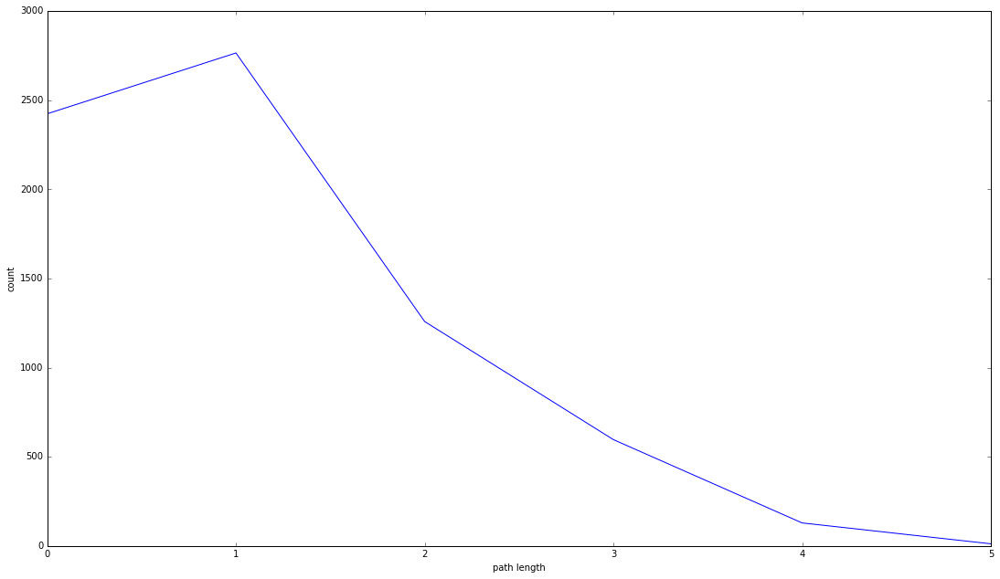

In [124]:
#Plotting the distrubution of lenghts
plt.plot(dic_C1.values())
plt.ylabel('count')
plt.xlabel('path length')
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5, forward=True)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/lenght_graph.png')

The hypothesis seems to have been pretty much confirmed,

**It is also be interested to look at the communities in this network to compare the best partition algorithm to the actual communities(i.e. departments).Looking at assotativity will also denote telling analytical data**

In [125]:
#using  networkx to create the prober subgraph using the weakly connected component (WCC)
#generating corresponding undirected graph to the philosopher directed graph

G3 = max(nx.weakly_connected_component_subgraphs(G2,copy=True),key=len)
H = G3.to_undirected()

In [126]:
#networkx function to get the assortativity
r = nx.degree_assortativity_coefficient(H)
print "Assortativity of the undirected graph: %s" %r

Assortativity of the undirected graph: -0.0667934917309


The negative value indicate that smiliar high-degree courses do not show a  tendency to link to other high-degree nodes.

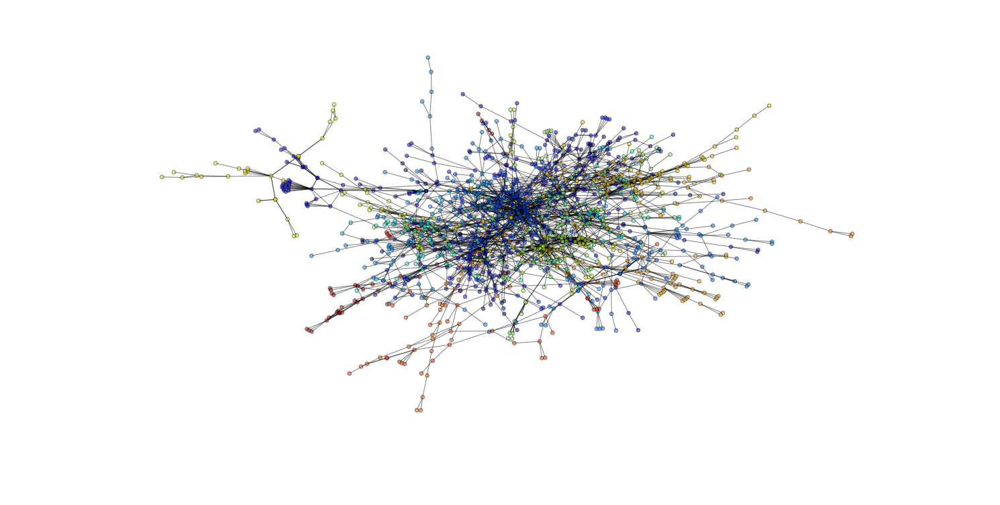

In [129]:
#using the community package to calculate the modularity using the Louvain-algroithm
#for directed graphs the partition has to be set manually. in our case we can set it to represent the 21 departments
#part = community.best_partition(H)
part = community.best_partition(H)
pos=nx.spring_layout(H, scale=5)
values = [part.get(node) for node in H.nodes()]
plt.figure(num=None, figsize=(20, 10), dpi=1500)    
nx.draw_spring(H, cmap = plt.get_cmap('jet'), node_color = values, node_size=30, with_labels=False,alpha=0.5)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/communities_graph.png')
plt.show()


**We will also look at the moudlarity as this value can be compared to the modularity of the network containing the actual partition (departmnents as communities) which again denotes interesting analytical data**

In [130]:
mod = community.modularity(part,H)
print "modularity:", mod

modularity: 0.805352995503


# Part 2: Department based Network

In [9]:
#first part was retrieving the data which is ouputted as csv files containg
#course information for each course within each department
#next part is about creating a network of all the courses
#firstly the csv files containing the data are loaded into python
#overview of csv files content:
#checkout assignment 2 for some network analysis 

#COURSE NUMBER,COURSE NAME,LANGUAGE OF INSTRUCTION,CREDIT LOAD,YEAR,SCHEDULE,COURSE TYPE,DEPARTMENT,GENERAL COURSE OBJECTIVES,LEARNING OBJECTIVES,CONTENT,RECOMMENDED PREREQUISITES,COURSE RESPONSIBLE

rootdir='C:/Users/DRC/Desktop/social_csv_folder'
list_of_df_for_each_department={}
for filename in os.listdir(rootdir):
    if filename.endswith('.csv'):
        #print filename
        df=pd.read_csv(rootdir+"/"+filename,converters={'COURSE NUMBER': lambda x: str(x),'RECOMMENDED PREREQUISITES':lambda x: str(x)})
        df2=df.dropna(thresh=11)
        list_of_df_for_each_department[filename]=df2

In [10]:
super_list_of_nodes=[]
for i in range(0,len(list_of_df_for_each_department.values())):
               list_of_nodes=list_of_df_for_each_department.values()[i]['COURSE NUMBER'].tolist()
               super_list_of_nodes.append(list_of_nodes)
               
super_list_of_links=[]
for i in range(0,len(list_of_df_for_each_department)):
               list_of_nodes=list_of_df_for_each_department.values()[i]['RECOMMENDED PREREQUISITES'].tolist()
               super_list_of_links.append(list_of_nodes)

In [11]:
list_of_dicts=[]
for i in range(0,len(super_list_of_nodes)):
    sub_dict={}
    for j in range(0,len(super_list_of_nodes[i])):
        sub_dict[super_list_of_nodes[i][j]]=super_list_of_links[i][j]
    list_of_dicts.append(sub_dict)


In [12]:
new_list_of_dicts={}
for i in range(0,len(list_of_dicts)):
    new_dict_list_of_links={}
    for k,v in list_of_dicts[i].items():
        try:
            temp_list=re.findall('\w+',v)
            new_dict_list_of_links[k]=temp_list
        except TypeError:
            pass
    new_list_of_dicts[list_of_df_for_each_department.keys()[i]]=new_dict_list_of_links

In [13]:
new_dict={ k: v for d in new_list_of_dicts.values() for k, v in d.items() }

In [14]:
final_length=0
for i in range(0,len(new_list_of_dicts)):
    final_length = final_length + len(new_list_of_dicts.values()[i])
print final_length

1696


In [15]:
c=0
color_map_list=[]
for k,v in new_list_of_dicts.items():
    c= c + 1
    for i in range(0,len(v.keys())):
        color_map_list.append(c)

In [16]:
len(color_map_list)

1696

In [17]:
temp_dict={}
for k,v in new_dict.items():
    for item in v: 
        temp_dict[k]=item

In [18]:
tuple_list_links=temp_dict.items()

In [19]:
G=nx.DiGraph()
G.add_nodes_from(new_dict.keys())
G.add_edges_from(tuple_list_links)

In [20]:
G.remove_node('None')

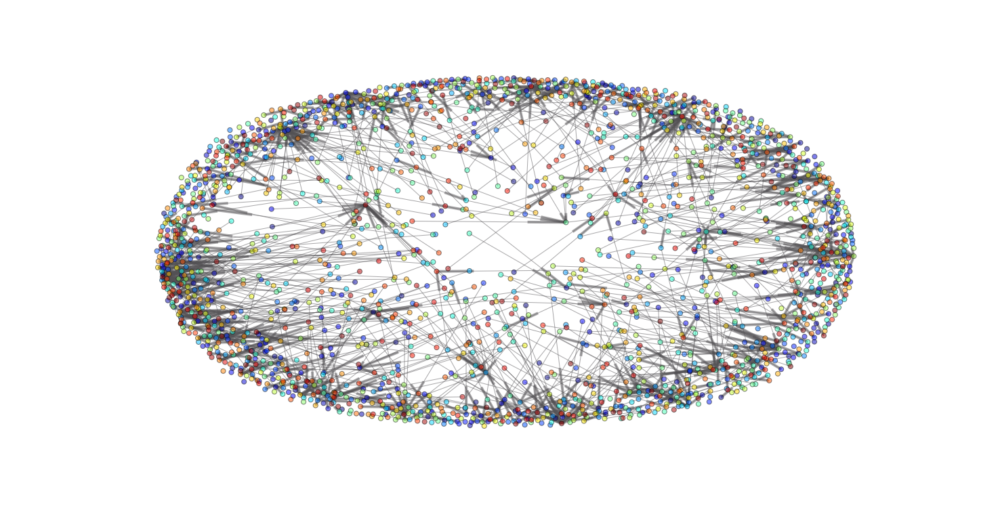

In [21]:
plt.figure(num=None, figsize=(20, 10), dpi=1500)   
pos = nx.spring_layout(G,scale=5, k=0.15, iterations=50)
nx.draw(G,pos, edge_color='#535154',node_color=range(len(G.nodes())),node_size=50,cmap = plt.get_cmap('jet'),with_labels=False,alpha=0.5)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/colored_network_communities.png')
plt.show()

To get a better overview for later we draw graphs for each department and saves them.

In [22]:
def department_pic(dict_list,name):
    sub_dict={}
    plt.figure(num=None, figsize=(20, 10), dpi=1500)
    G2=nx.DiGraph(dict_list)
    pos = nx.spring_layout(G2,scale=5, k=0.15, iterations=50)
    #print str(count / size)
    nx.draw(G2,pos, edge_color='#535154',node_size=50,alpha=0.5,with_labels=False)
    plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/new_final_pic/'+name+'.png')
    plt.show()
    G2 = max(nx.weakly_connected_component_subgraphs(G2,copy=True),key=len)
    H2= G2.to_undirected()
    part = community.best_partition(H2)
    mod = community.modularity(part,H2)
    print name,mod
    sub_dict[name]=mod
    return name,mod
    

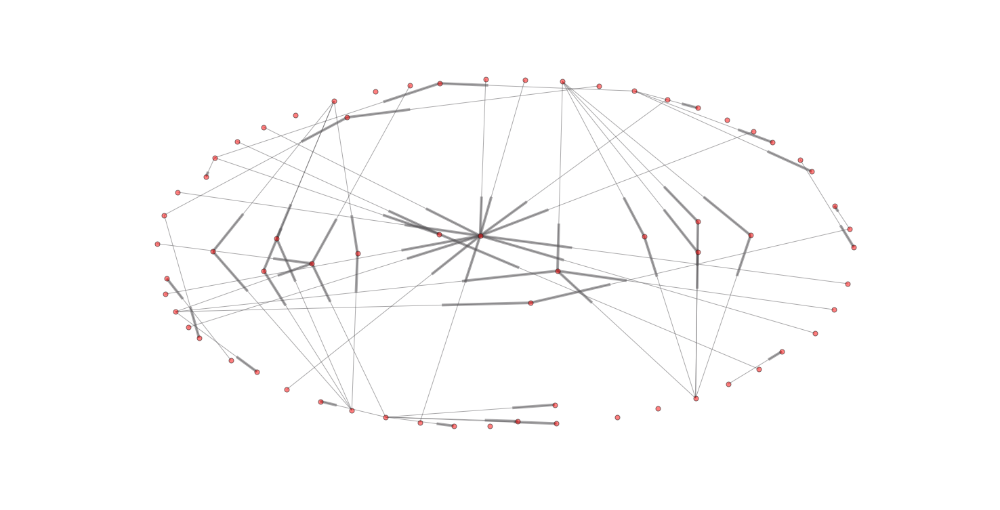

DTU.csv 0.5656


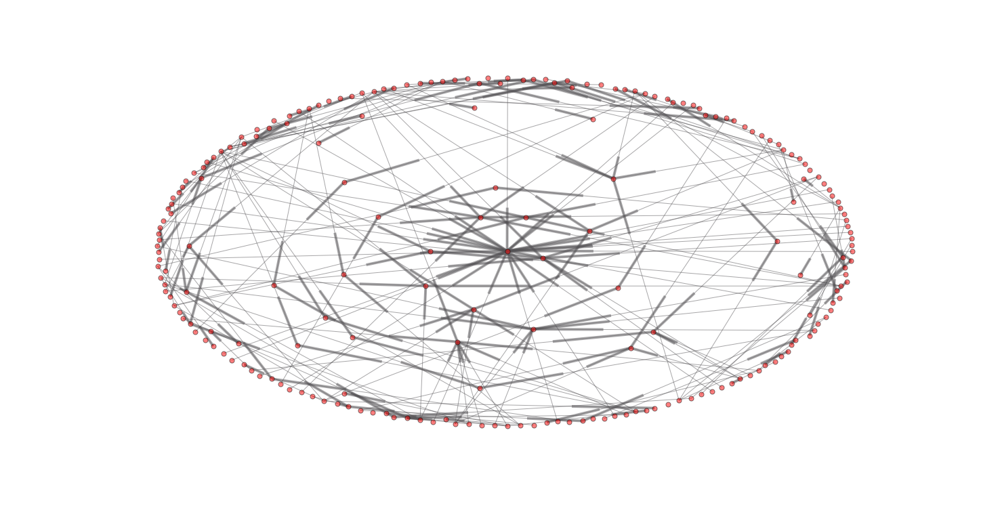

Department-of-Electrical-Engineering.csv 0.785183983123


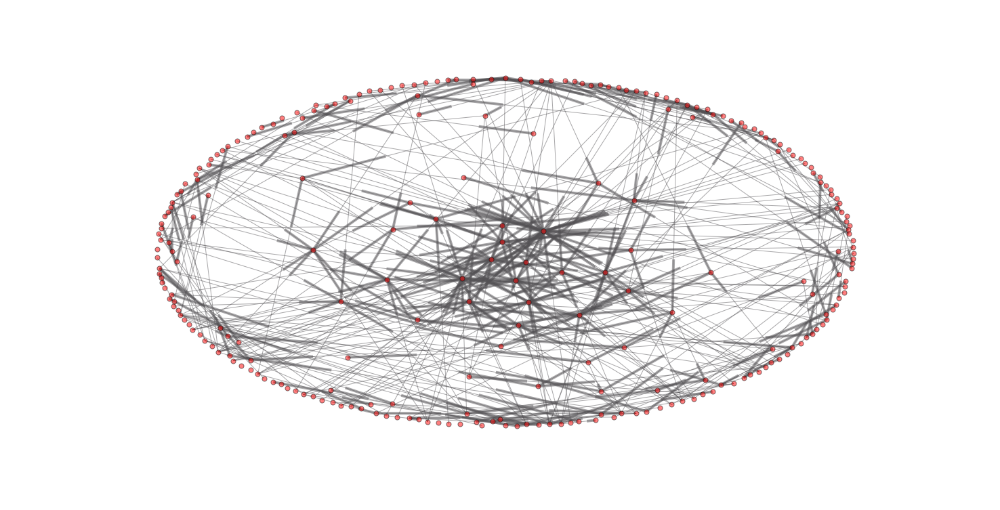

Department-of-Applied-Mathematics-and-Computer-Science.csv 0.683374167899


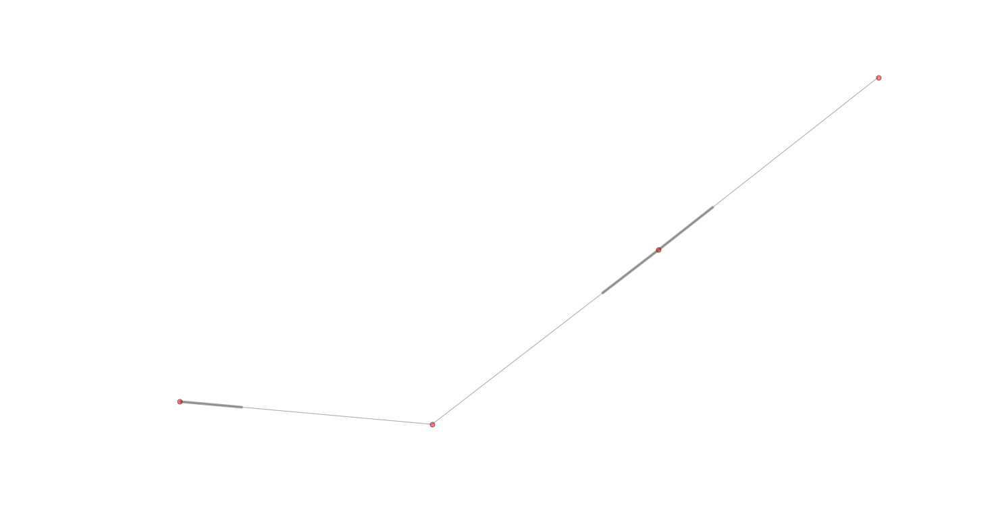

Department-of-Transport.csv 0.166666666667


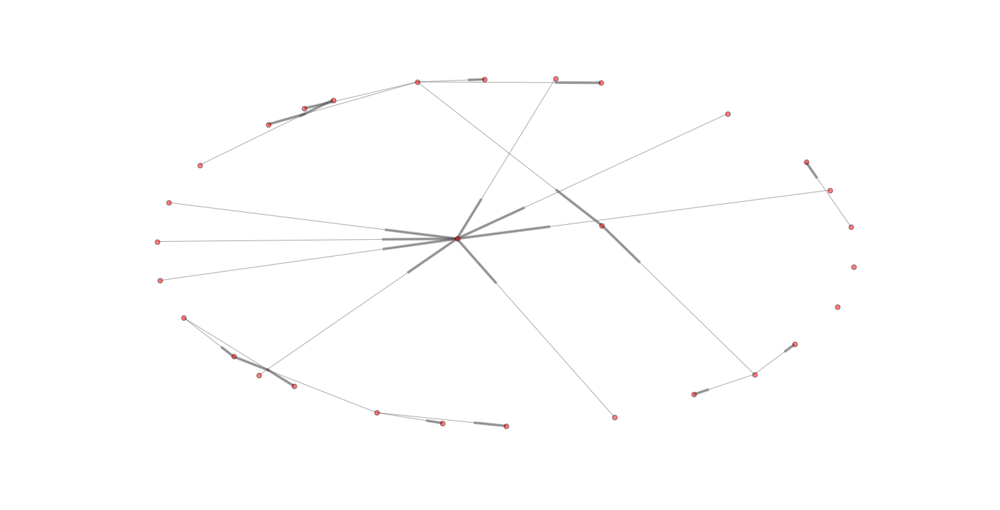

National-Veterinary-Institute.csv 0.3671875


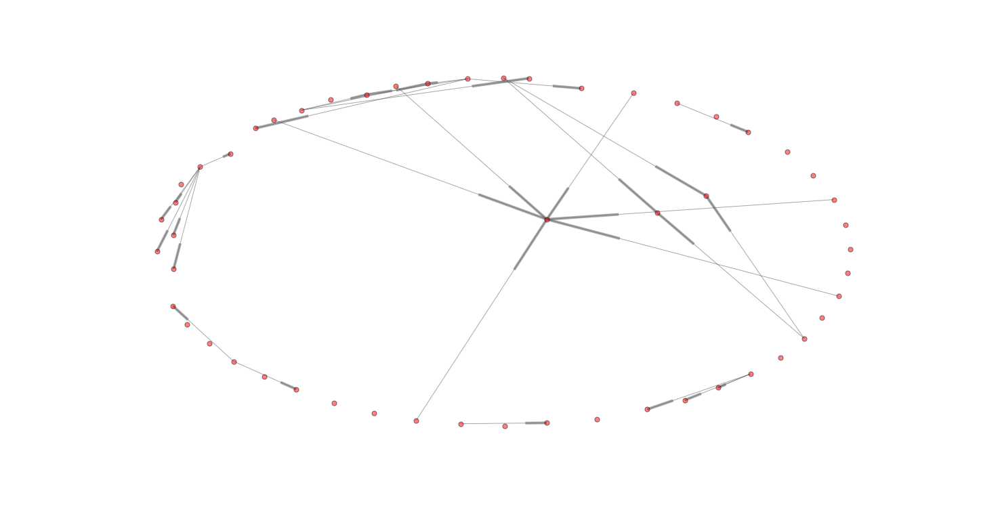

Department-of-Micro-and-Nanotechnology.csv 0.0


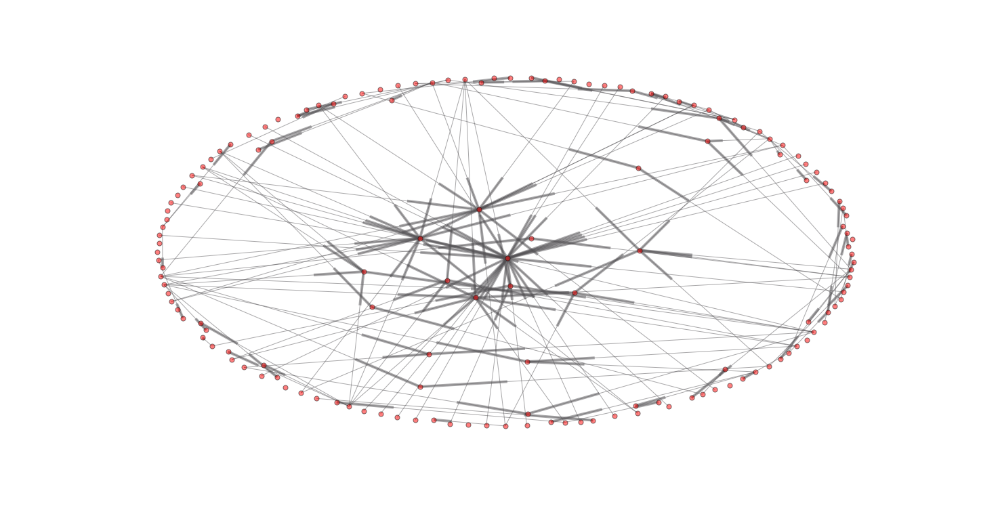

Department-of-Chemical-Engineering.csv 0.600925249574


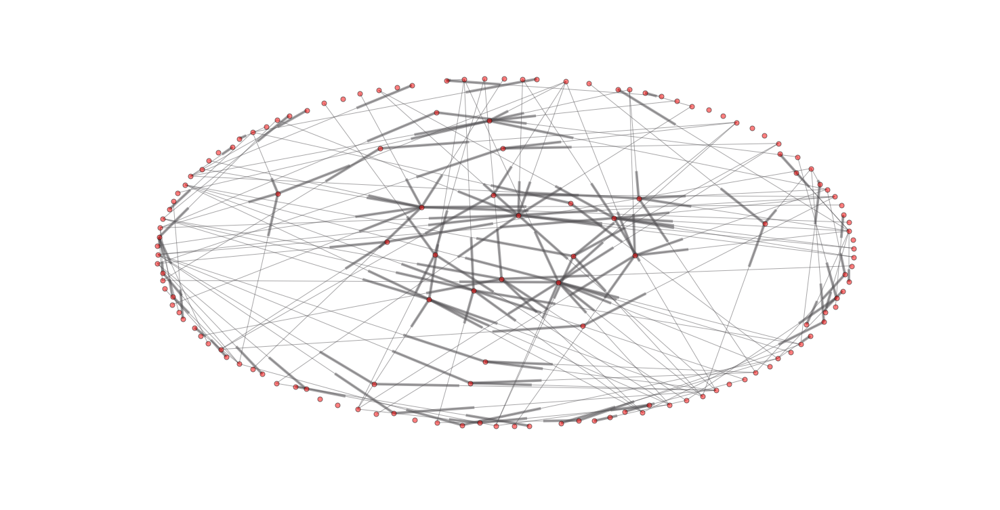

Department-of-Photonics-Engineering.csv 0.6858984375


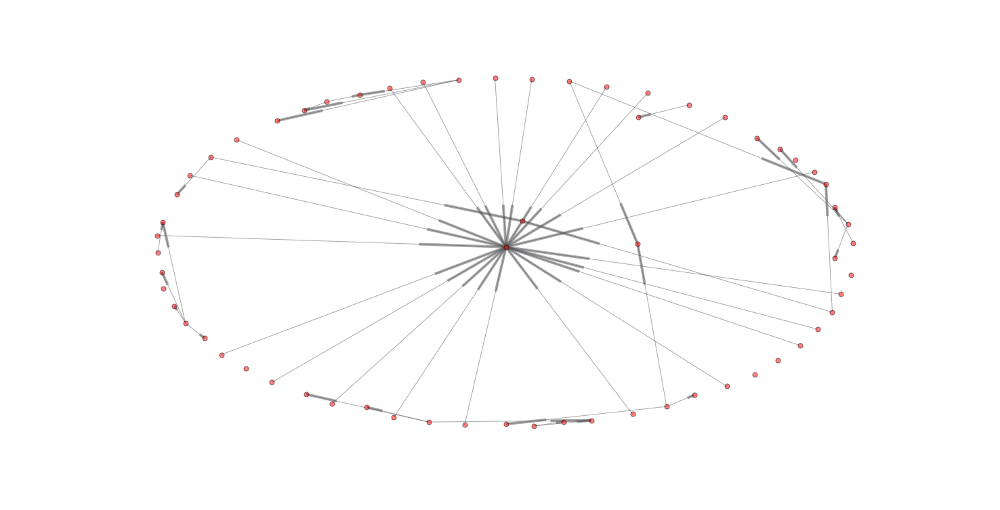

National-Food-Institute.csv 0.0


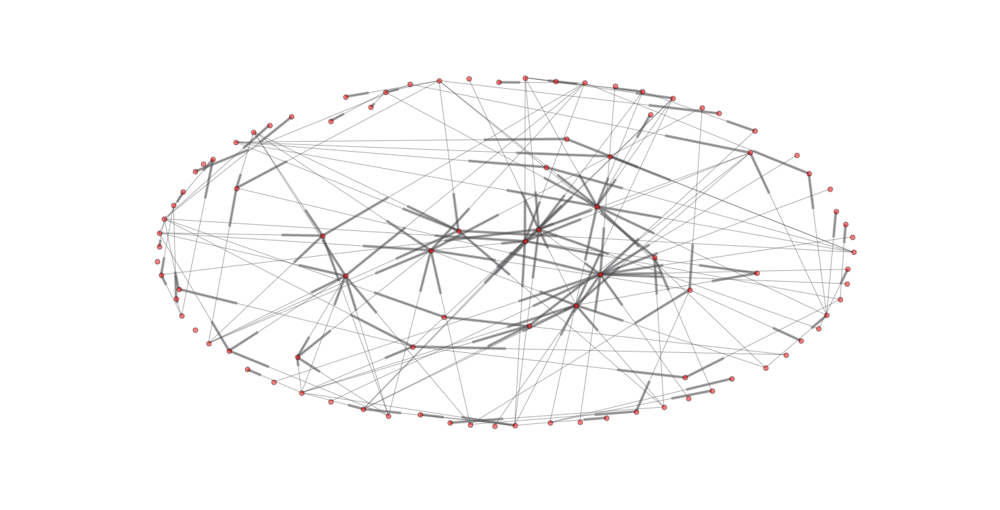

Department-of-Systems-Biology.csv 0.611981329852


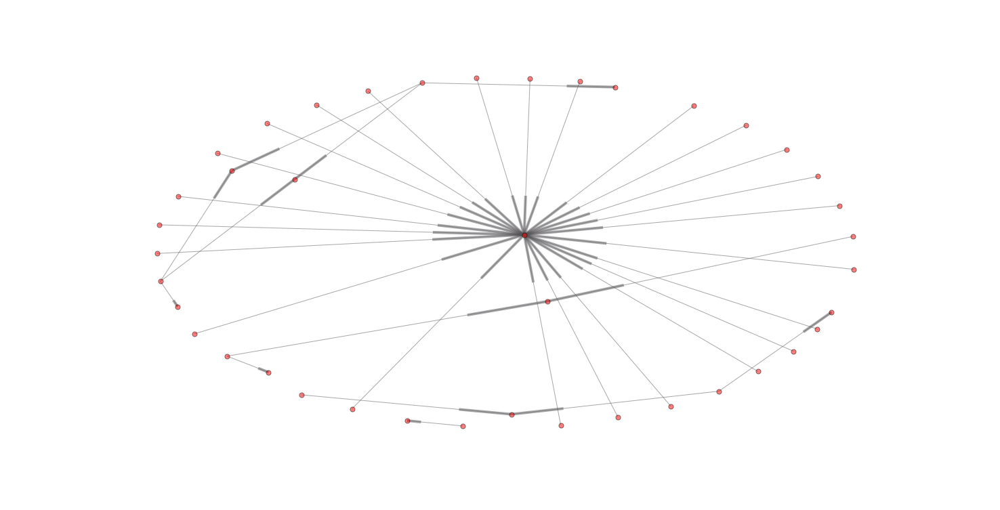

National-Institute-of-Aquatic-Resources.csv 0.0


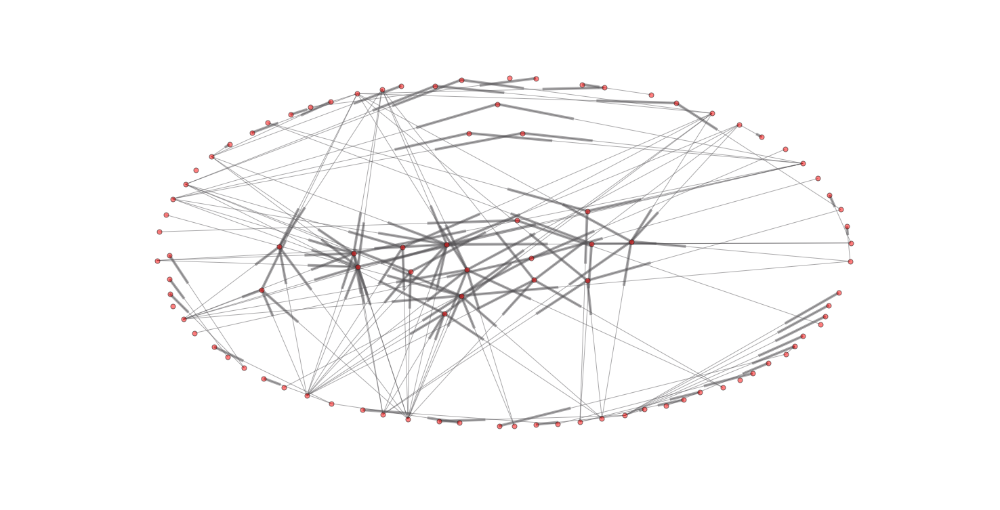

National-Space-Institute.csv 0.432257811888


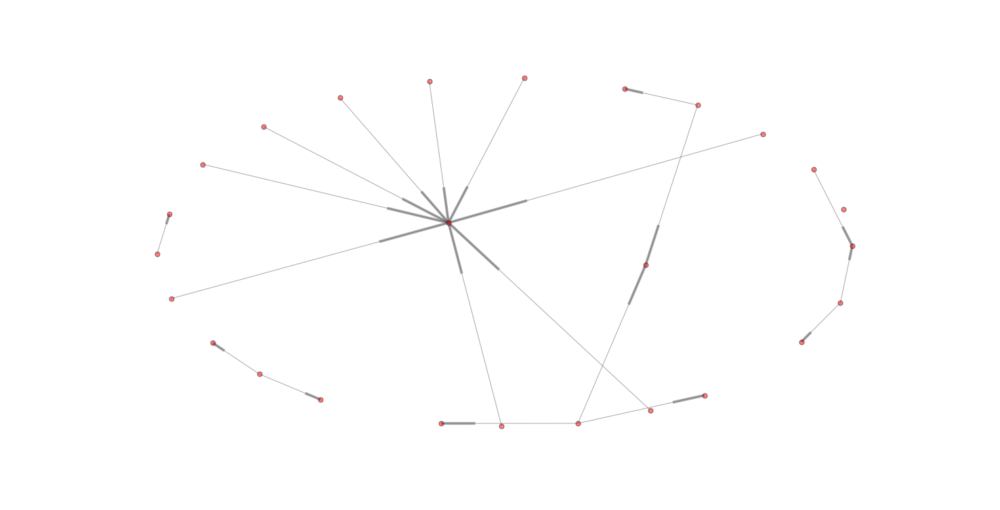

Other-courses.csv 0.0


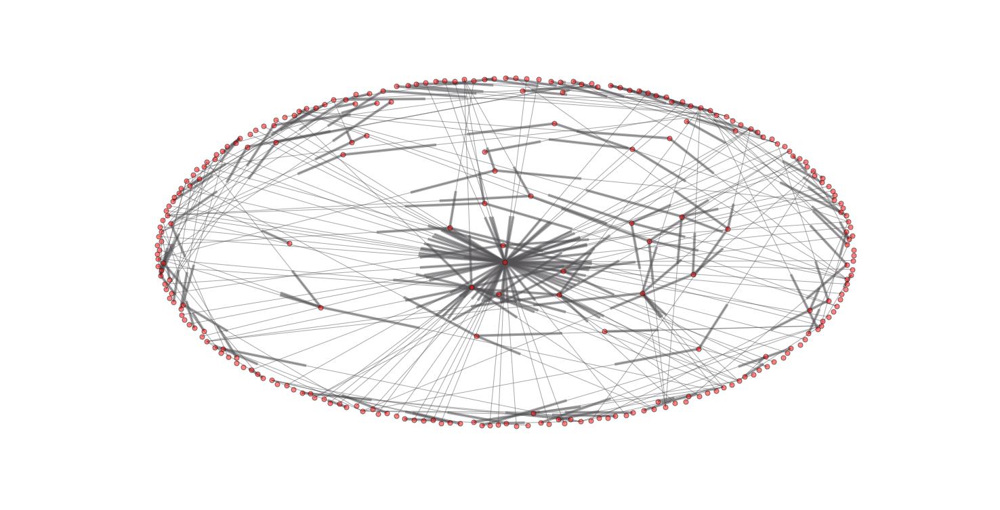

DTU-Management-Engineering.csv 0.738076923077


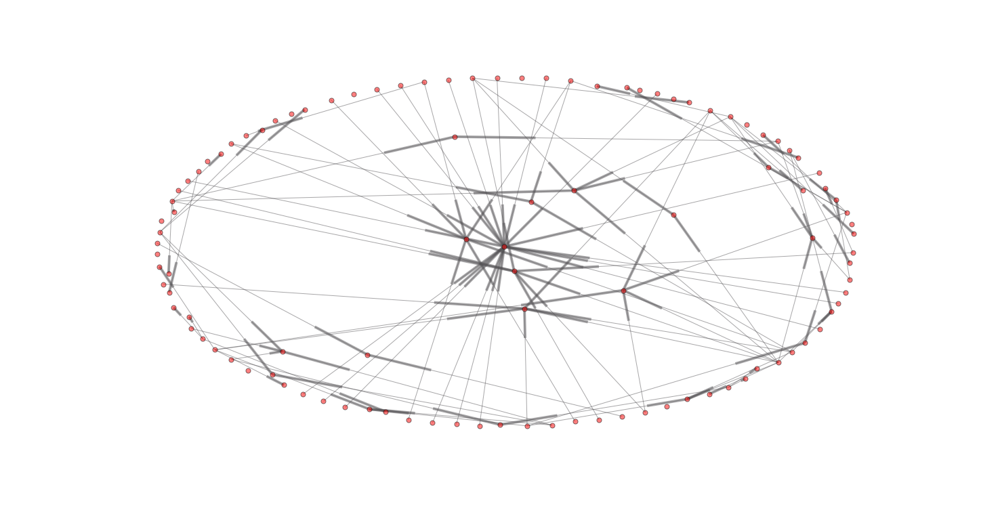

Department-of-Chemistry.csv 0.637785467128


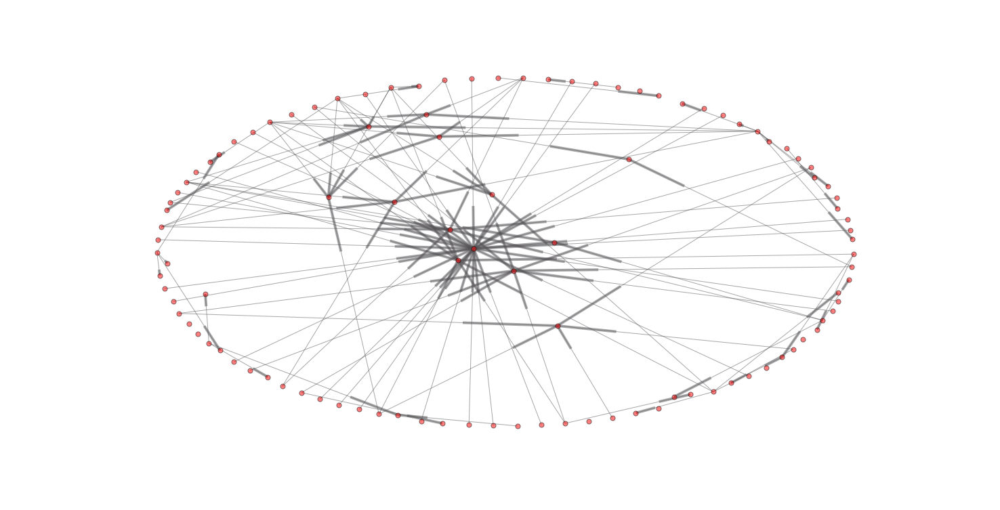

Department-of-Physics.csv 0.548163389727


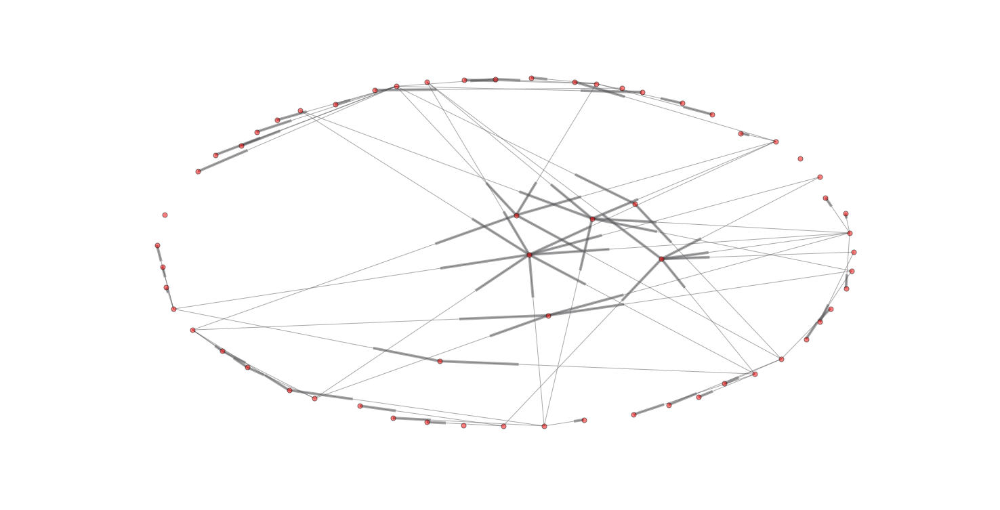

DTU-Wind-Energy.csv 0.587384259259


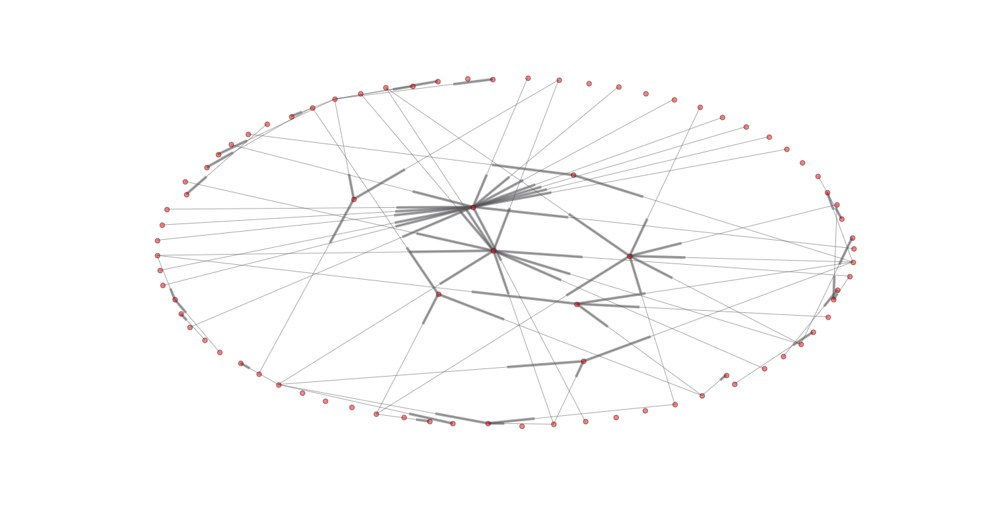

Department-of-Environmental-Engineering.csv 0.602652825836


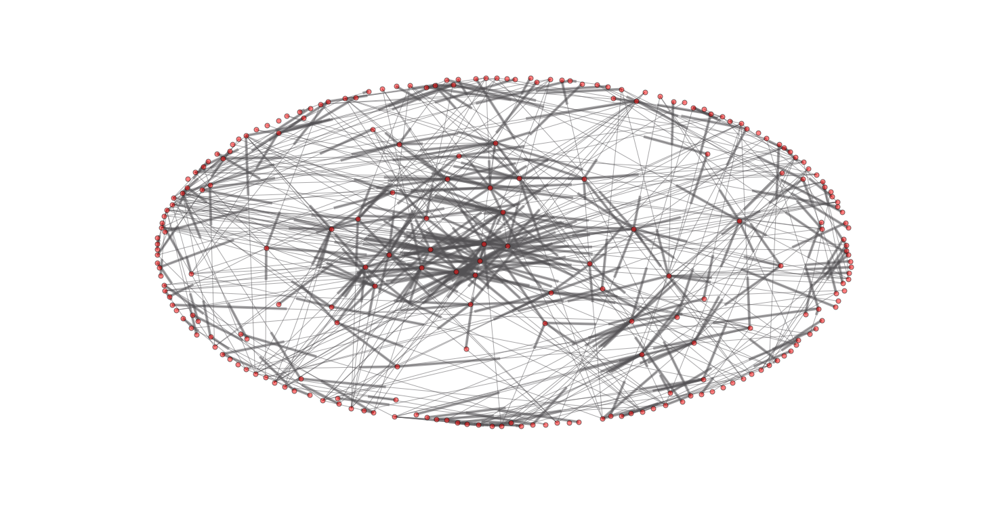

Department-of-Mechanical-Engineering.csv 0.67481437165


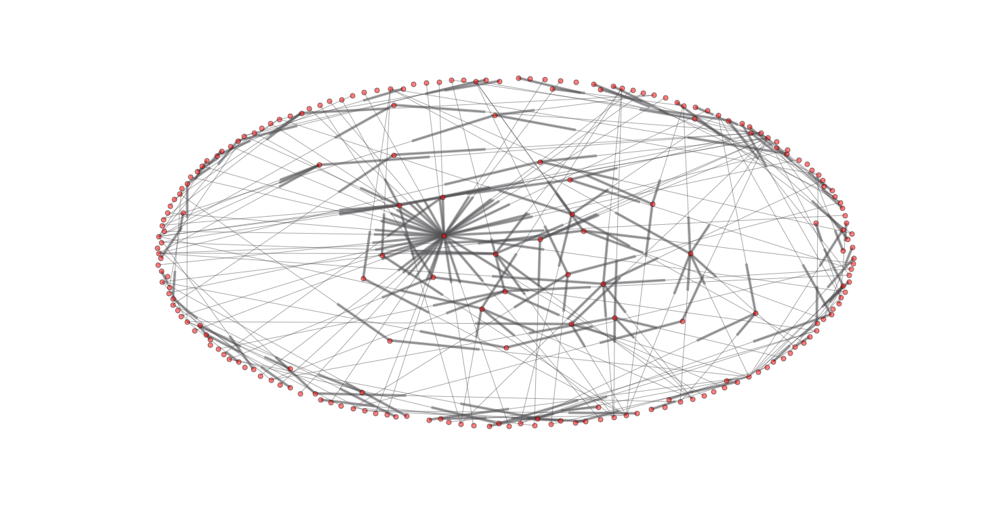

Department-of-Civil-Engineering.csv 0.74608268493


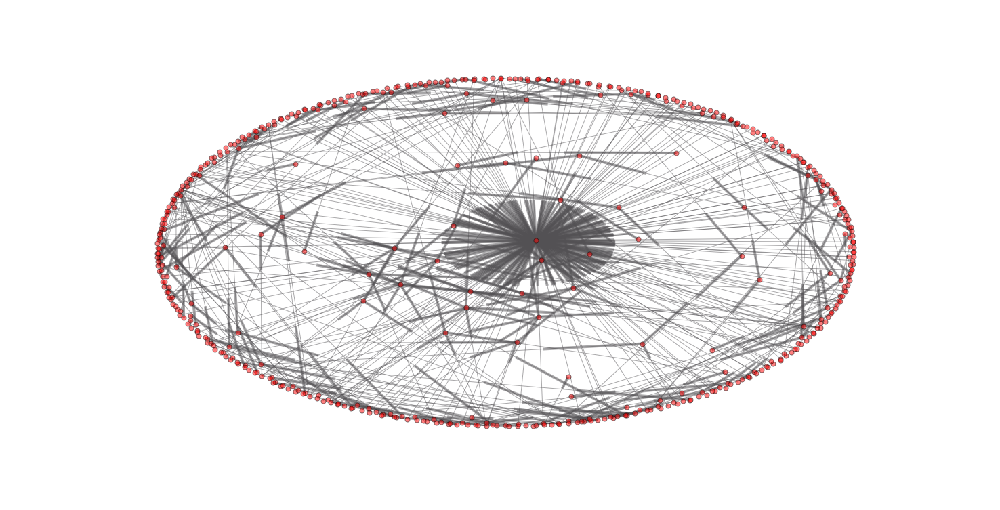

DTU-Diplom.csv 0.0


In [23]:
list_of_dicts=[]
for i in range(0,len(new_list_of_dicts.keys())):
    list_of_dicts.append(department_pic(new_list_of_dicts.values()[i],new_list_of_dicts.keys()[i]))

In [24]:
#printing out the modularity value of each department
for k,v in dict(list_of_dicts).items():
    print k,v

Department-of-Systems-Biology.csv 0.611981329852
Department-of-Electrical-Engineering.csv 0.785183983123
Department-of-Applied-Mathematics-and-Computer-Science.csv 0.683374167899
Department-of-Transport.csv 0.166666666667
Department-of-Micro-and-Nanotechnology.csv 0.0
National-Institute-of-Aquatic-Resources.csv 0.0
Department-of-Physics.csv 0.548163389727
Department-of-Photonics-Engineering.csv 0.6858984375
DTU.csv 0.5656
National-Food-Institute.csv 0.0
National-Veterinary-Institute.csv 0.3671875
Other-courses.csv 0.0
DTU-Management-Engineering.csv 0.738076923077
Department-of-Chemistry.csv 0.637785467128
Department-of-Chemical-Engineering.csv 0.600925249574
DTU-Wind-Energy.csv 0.587384259259
National-Space-Institute.csv 0.432257811888
DTU-Diplom.csv 0.0
Department-of-Mechanical-Engineering.csv 0.67481437165
Department-of-Civil-Engineering.csv 0.74608268493
Department-of-Environmental-Engineering.csv 0.602652825836


In [25]:
dict(list_of_dicts).keys()

['Department-of-Systems-Biology.csv',
 'Department-of-Electrical-Engineering.csv',
 'Department-of-Applied-Mathematics-and-Computer-Science.csv',
 'Department-of-Transport.csv',
 'Department-of-Micro-and-Nanotechnology.csv',
 'National-Institute-of-Aquatic-Resources.csv',
 'Department-of-Physics.csv',
 'Department-of-Photonics-Engineering.csv',
 'DTU.csv',
 'National-Food-Institute.csv',
 'National-Veterinary-Institute.csv',
 'Other-courses.csv',
 'DTU-Management-Engineering.csv',
 'Department-of-Chemistry.csv',
 'Department-of-Chemical-Engineering.csv',
 'DTU-Wind-Energy.csv',
 'National-Space-Institute.csv',
 'DTU-Diplom.csv',
 'Department-of-Mechanical-Engineering.csv',
 'Department-of-Civil-Engineering.csv',
 'Department-of-Environmental-Engineering.csv']

In [33]:
overall_mod=sum(dict(list_of_dicts).values())/len(dict(list_of_dicts).values())
print "The overall modularity is %r"%overall_mod

The overall modularity is 0.4492397651481369


In [34]:
H = G.to_undirected()

In [37]:
#using  networkx to create the prober subgraph using the weakly connected component (WCC)
#generating corresponding undirected graph to the philosopher directed graph

G = max(nx.weakly_connected_component_subgraphs(G,copy=True),key=len)
H = G.to_undirected()

In [38]:
#networkx function to get the assortativity
r = nx.degree_assortativity_coefficient(H)
print "Assortativity of the undirected graph: %s" %r

Assortativity of the undirected graph: -0.62051031276


In [39]:
#using the community package to calculate the modularity using the Louvain-algroithm
#for directed graphs the partition has to be set manually. in our case we can set it to represent the 21 departments
part = community.best_partition(H)


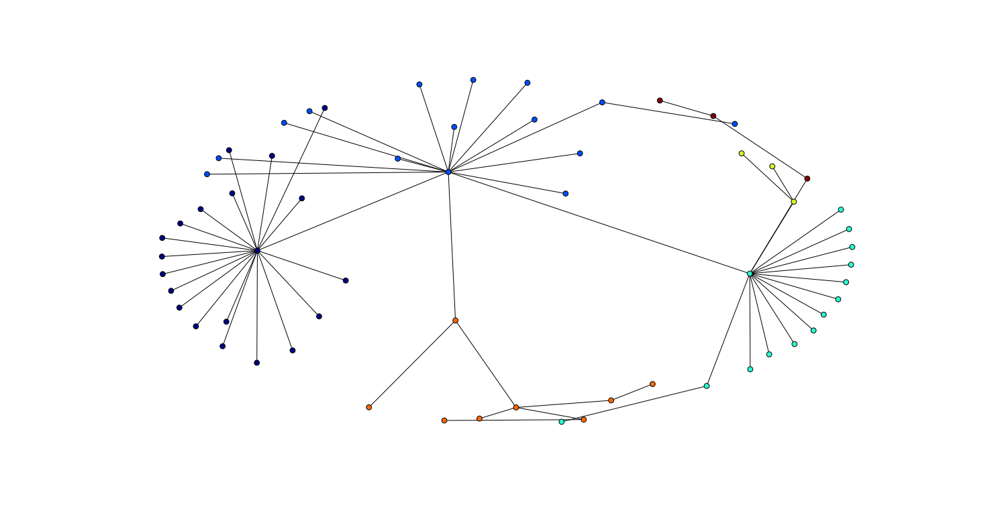

In [44]:
part = community.best_partition(H)
pos=nx.spring_layout(H, scale=5)
values = [part.get(node) for node in H.nodes()]
plt.figure(num=None, figsize=(20, 10), dpi=1500)    
nx.draw_spring(H, cmap = plt.get_cmap('jet'), node_color = values, node_size=60, with_labels=False)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/department_fig.png')
plt.show()

In [45]:
mod = community.modularity(part,H)
print("modularity:", mod)

('modularity:', 0.6853537981269512)


Comparable to the modularity of the whole network. We see that the modularity is much higher, so the departments are not the best way of defining the communities.

In [66]:
#new_dict_list_of_links.items()[45]
nx.write_graphml(G, 'graph_text.png')

# Part 3: Wordclouds

We used the text in the content description of each course within each department to identify what is weighted in each department and visualize using wordclouds. 

In [4]:
import re
import nltk
import string
from sklearn.feature_extraction.text import TfidfVectorizer
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
import os
import pandas as pd
from wordcloud import WordCloud
import numpy as np
import operator
import math
import community
from collections import Counter
import itertools
from nltk.corpus import stopwords
%matplotlib inline

In [5]:
dirroot='C:/Users/DRC/Desktop/social_csv_folder'
list_of_departments=[]
for filename in os.listdir(dirroot):
    if filename.endswith('.csv'):
        #print filename
        df=pd.read_csv(filename)
        list_of_departments.append(df)

In [50]:

con_dic = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
stop_words = stopwords.words('english')
stemmer = nltk.stem.porter.PorterStemmer()
for filename in con_dic:
    con_dic[filename] = pd.read_csv(dirroot+'/'+filename,dtype=object).dropna(how='all')
    con_dic[filename] = con_dic[filename]['CONTENT'].tolist()
    con_dic[filename] = [nltk.word_tokenize(re.sub('[^A-Za-z]+',' ', wds.decode('utf-8').lower())) for wds in con_dic[filename]]
    con_dic[filename] = [' '.join(list((set(smart)-set(stop_words)-set(['course'])))) for smart in con_dic[filename]]
    #con_dic[filename] = [' '.join([stemmer.stem(st) for st in item]) for item in con_dic[filename]]
    #con_dic[filename] = dict(enumerate(con_dic[filename],1))

In [51]:
new_condic = {}
vect = {}
#vectorizer = TfidfVectorizer(stop_words='english',decode_error='ignore',
                             #strip_accents='unicode',smooth_idf=True,max_df=0.9,use_idf=True)
for depts in con_dic:
    vect[depts] = TfidfVectorizer(stop_words='english',decode_error='ignore', 
                                 strip_accents='unicode',smooth_idf=True,max_df=0.9,use_idf=True)
    new_condic[depts] = vect[depts].fit_transform(con_dic[depts])
    #new_condic[depts] = new_condic[depts].todense().tolist()

In [52]:
lll = {k: '' for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
kkk = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
for dep in new_condic:
    for p in range(len(new_condic[dep].todense().tolist())):
        kkk[dep].extend(zip(vect[dep].get_feature_names(),new_condic[dep].todense().tolist()[p]))
    kkk[dep] = [(i,j+0.999) for i,j in list(set(kkk[dep])) if j!=0]
    for t,c in kkk[dep]:
        lll[dep] = lll[dep]+(t+' ')*int(round(c))

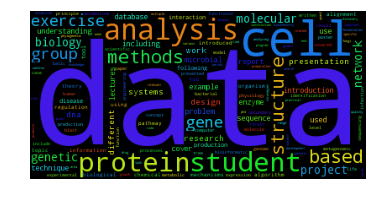

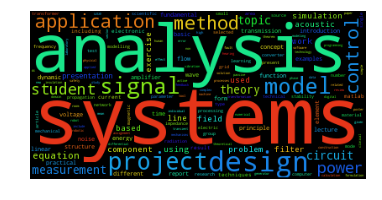

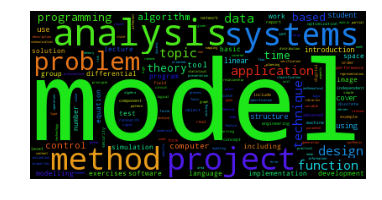

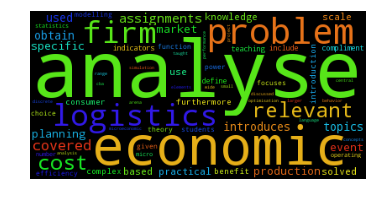

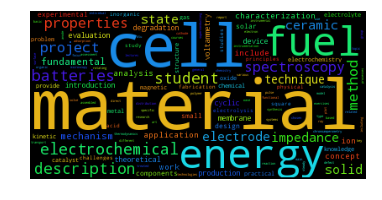

...

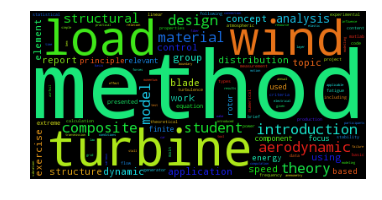

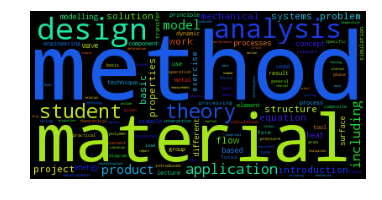

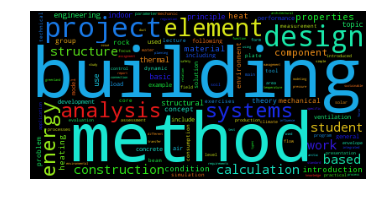

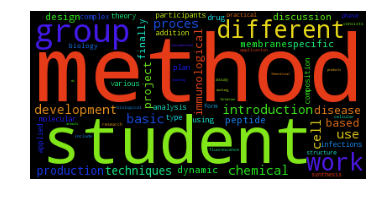

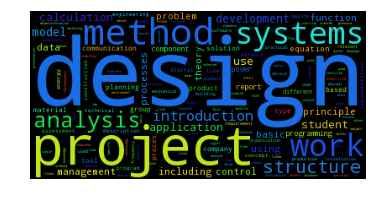

In [68]:
for dpts in lll:
    wordcloud = WordCloud().generate(lll[dpts])
    img=plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/wordclouds/'+dpts+".png")
    plt.show()

These wordclouds are interestting indicators for what is weighted more in each department. This can be useful for student who are not sure of which education they want or which department of education they mostly relate too. Having a list (or a visual stimulating cloud) of terms can help narrow down that search e.g. a studen who wants his education to weight on economy could search for department wordcloud that majorily (size-wise) contain the word "economy"(or similar) and finds his/her education within it. This is achieved using vectorization i.e. tf-idf of the words which consist of a pre-process using natrual language processing (NLTK).


# Part 4: Teachers network

Trying to create a network of teachers

In [6]:
dirroot='C:/Users/DRC/Desktop/social_csv_folder'


con_dic = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
stop_words = stopwords.words('english')
stemmer = nltk.stem.porter.PorterStemmer()
for filename in con_dic:
    con_dic[filename] = pd.read_csv(dirroot+'/'+filename,dtype=object).dropna(how='all')
    con_dic[filename] = con_dic[filename]['CONTENT'].tolist()
    con_dic[filename] = [nltk.word_tokenize(re.sub('[^A-Za-z]+',' ', wds.decode('utf-8').lower())) for wds in con_dic[filename]]
    con_dic[filename] = [' '.join(list((set(smart)-set(stop_words)-set(['course'])))) for smart in con_dic[filename]]
    #con_dic[filename] = [' '.join([stemmer.stem(st) for st in item]) for item in con_dic[filename]]
    #con_dic[filename] = dict(enumerate(con_dic[filename],1))

In [7]:

teach_dic = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}




for filename in con_dic:
    teach_dic[filename] = pd.read_csv(dirroot+'/'+filename,dtype=object).dropna(how='all')
    #con_dic[filename] = con_dic[filename]['CONTENT'].tolist()
    #con_dic[filename] = [nltk.word_tokenize(re.sub('[^A-Za-z]+',' ', wds.decode('utf-8').lower())) for wds in con_dic[filename]]
    #con_dic[filename] = [' '.join(list((set(smart)-set(stop_words)-set(['course'])))) for smart in con_dic[filename]]
    #con_dic[filename] = [' '.join([stemmer.stem(st) for st in item]) for item in con_dic[filename]]
    #con_dic[filename] = dict(enumerate(con_dic[filename],1))
uber_dict={}
for i in con_dic.keys():
    course_responsible = {}
    for index, row in teach_dic[i].iterrows():
        rw = re.sub('\s+', ' ',row['COURSE RESPONSIBLE'])
        for tech in [y.strip() for y in rw.split(',')]:
            try:
                course_responsible[tech].extend(row['COURSE NUMBER'].split())
            except:
                course_responsible[tech] = [row['COURSE NUMBER']]
    uber_dict[i]=course_responsible
    
uber_dict.values()

[{'Anders Christian Wulff': ['47325 ', '47326'],
  'Andreas Kaiser': ['47304 ', '47324'],
  'Anke Hagen': ['47509 '],
  'Anne Hauch': ['47321 ', '47322', '47421', '47422'],
  'Asger Bech Abrahamsen': ['47325 ', '47326'],
  'Bert de Haart': ['47509 '],
  'Bhaskar Reddy Sudireddy': ['47324 '],
  'David Aili': ['47318 '],
  'Didier Blanchard': ['47309 ', '47409'],
  'Eugen Stamate': ['47323 ', '47423'],
  'Eva Bundgaard': ['47320 ', '47420', '47506'],
  'Frederik C Krebs': ['47320 ', '47420', '47506'],
  'Heine Anton Hansen': ['47316 '],
  'Ifan Stephens': ['47309 ', '47409'],
  'Irina Petrushina': ['47304 ', '47305', '47501'],
  'Jacob R. Bowen': ['47311 '],
  'Jean-Claude Grivel': ['47321 ', '47322', '47421', '47422'],
  'Jens Oluf Jensen': ['47301 ', '47302', '47317', '47507'],
  'Jimmi Nielsen': ['47502 '],
  'Johan Hjelm': ['47310 '],
  'Juan Maria Garc\xc3\xada Lastra': ['47316 ', '47508'],
  'Karsten Agersted': ['47314 ', '47414'],
  'Kent Kammer Hansen': ['47313 ', '47413'],
  'La

In [8]:
super_duper_dict={}
for k, v in uber_dict.items():
    list_of_teachers=[]
    for k2,v2 in v.items():
        list_of_teachers.append(k2)
    super_duper_dict[k]=list_of_teachers

In [9]:
B=nx.Graph(super_duper_dict)

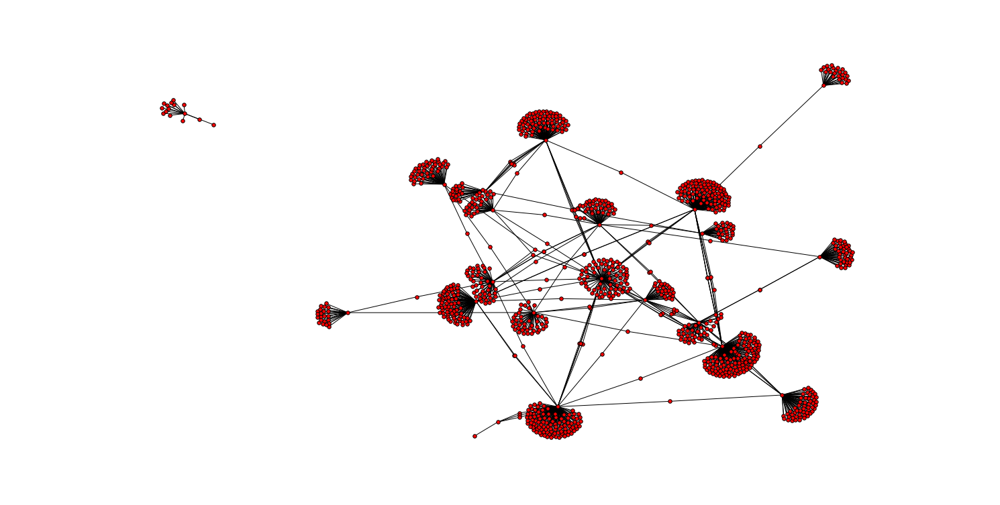

In [10]:
pos=nx.spring_layout(B, scale=5)
plt.figure(num=None, figsize=(20, 10), dpi=1500)    
nx.draw_spring(B, node_size=30, with_labels=False)
plt.show()


In [11]:
list_of_color_nodes=[]
for i in B.nodes():
    if 'csv' in i:
        list_of_color_nodes.append(i)
#list_of_color_nodes

In [12]:
color_map=[]
for node in B:
    if node in list_of_color_nodes:
        color_map.append('blue')
    else:
        color_map.append('red')

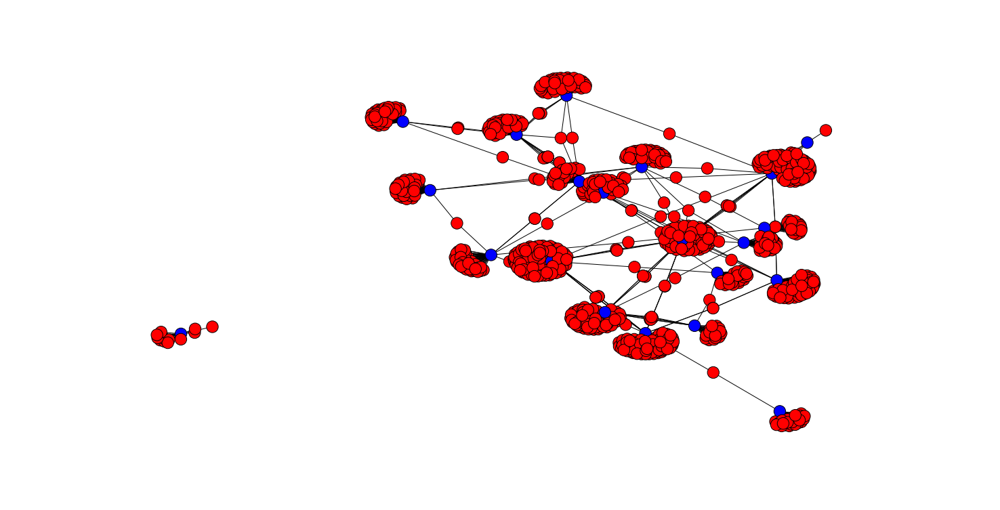

In [13]:
# -*- coding: utf-8 -*-

pos=nx.spring_layout(B, scale=5)
plt.figure(num=None, figsize=(20, 10), dpi=1500)          
nx.draw(B,pos,node_color=color_map, with_labels=False)
plt.show()

In [14]:
labels = {}    
for node in B.nodes():
    if node in list_of_color_nodes:
        #set the node name as the key and the label as its value 
        labels[node] = node


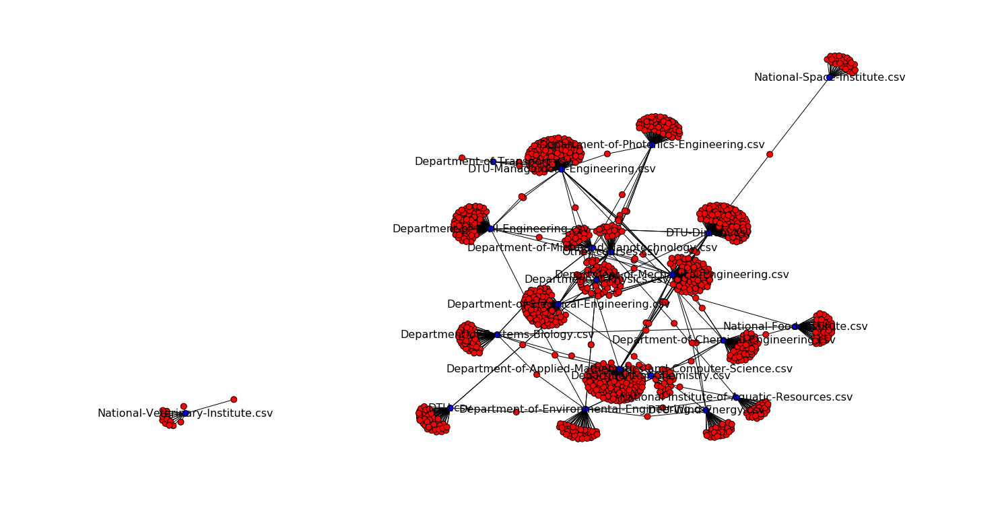

In [15]:
plt.figure(num=None, figsize=(20, 10), dpi=1500)          
#set the argument 'with labels' to False so you have unlabeled graph
pos=nx.spring_layout(B, scale=5)
nx.draw(B,pos,node_color=color_map,with_labels=False,node_size=80)
#Now only add labels to the nodes you require (the hubs in my case)
nx.draw_networkx_labels(B,pos,labels,font_size=16,font_color='black')
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/teacher_network.png')
plt.show()

This network visualizes how the teaches are connected across departments by which teacher's name appear in each department

In [16]:
#possibly do some more analysis on this netowrk 

In [17]:
teacher_dic=nx.betweenness_centrality(B)

In [22]:
department_centrality={}
for k,v in teacher_dic.items():
    if k in labels.values():
        print k,v
        department_centrality[k]=v

Department-of-Transport.csv 0.0018662155081
National-Food-Institute.csv 0.0766515133072
DTU-Management-Engineering.csv 0.241006773754
National-Veterinary-Institute.csv 0.000162746153557
National-Institute-of-Aquatic-Resources.csv 0.0663865135928
Department-of-Chemical-Engineering.csv 0.146487264041
Other-courses.csv 0.0398747557566
DTU-Diplom.csv 0.233125365989
National-Space-Institute.csv 0.0442311853822
Department-of-Applied-Mathematics-and-Computer-Science.csv 0.255187245052
Department-of-Photonics-Engineering.csv 0.105719545961
Department-of-Micro-and-Nanotechnology.csv 0.182001269013
Department-of-Civil-Engineering.csv 0.162682889437
DTU.csv 0.0699286991041
Department-of-Physics.csv 0.104769397632
Department-of-Environmental-Engineering.csv 0.156865813099
Department-of-Systems-Biology.csv 0.11884569099
Department-of-Chemistry.csv 0.0414120573771
Department-of-Mechanical-Engineering.csv 0.331165165718
DTU-Wind-Energy.csv 0.0674661726089
Department-of-Electrical-Engineering.csv 0.16

In [27]:
for k,v in sorted(department_centrality.items(), key=lambda x:x[1],reverse=True):
    print k,v


Department-of-Mechanical-Engineering.csv 0.331165165718
Department-of-Applied-Mathematics-and-Computer-Science.csv 0.255187245052
DTU-Management-Engineering.csv 0.241006773754
DTU-Diplom.csv 0.233125365989
Department-of-Micro-and-Nanotechnology.csv 0.182001269013
Department-of-Electrical-Engineering.csv 0.16419889873
Department-of-Civil-Engineering.csv 0.162682889437
Department-of-Environmental-Engineering.csv 0.156865813099
Department-of-Chemical-Engineering.csv 0.146487264041
Department-of-Systems-Biology.csv 0.11884569099
Department-of-Photonics-Engineering.csv 0.105719545961
Department-of-Physics.csv 0.104769397632
National-Food-Institute.csv 0.0766515133072
DTU.csv 0.0699286991041
DTU-Wind-Energy.csv 0.0674661726089
National-Institute-of-Aquatic-Resources.csv 0.0663865135928
National-Space-Institute.csv 0.0442311853822
Department-of-Chemistry.csv 0.0414120573771
Other-courses.csv 0.0398747557566
Department-of-Transport.csv 0.0018662155081
National-Veterinary-Institute.csv 0.000162